In [1]:
from IPython.display import display
from IPython.display import HTML
import IPython.core.display as di # Example: di.display_html('<h3>%s:</h3>' % str, raw=True)

# This line will hide code by default when the notebook is exported as HTML
di.display_html('<script>jQuery(function() {if (jQuery("body.notebook_app").length == 0) { jQuery(".input_area").toggle(); jQuery(".prompt").toggle();}});</script>', raw=True)

# This line will add a button to toggle visibility of code blocks, for use with the HTML export version
di.display_html('''<button onclick="jQuery('.input_area').toggle(); jQuery('.prompt').toggle();">Toggle code</button>''', raw=True)


Toggle code

In [2]:
# all modules necessary for this nb
import os
import sys
import pickle

import numpy as np
np.random.seed(0)
import pylab as pl
import scipy.stats as sstats

# setting parameters for default matplotlib plots
%matplotlib inline

In [3]:
pl.style.use('fabiostyle')
# needs to find the library of functions
sys.path.append('../../../code/')  # to be replaced!

import utils as ut
import plots as pt

In [4]:
NOTEBOOK_NAME = 'overlaps_pos&neg_dhpc_1sec'

In [5]:
from pickleshare import PickleShareDB

autorestore_folder = os.path.join(os.getcwd(), 'autorestore', NOTEBOOK_NAME)
db = PickleShareDB(autorestore_folder)
import sys
from workspace import *
import IPython
ip = IPython.get_ipython()

# this will restore all the saved variables. ignore the errors listed.
load_workspace(ip, db)

# use `save_worspace(db)` to save variables at the end

#this will cause text to be exported as 'true text' which can be edited in Adobe Illustrator
pl.rcParams['pdf.fonttype']=42
pl.rcParams['ps.fonttype']=42

In [6]:
from itertools import product
def load_all_animals_vars(varname, animal_list, pilot_list=None, notebook='preprocessing'):
    all_of_them = {}
    for ani in animal_list:
        folder = '../%s/notebooks/autorestore/%s/' % (ani, notebook)
        all_of_them.update({ani: ut.load_variable(varname, folder)})
    return all_of_them

In [7]:
all_animals =      'dhpcg1','dhpcg20','dhpc24'
pre_animals =      'dhpcg1','dhpcg20','dhpc24'
post_animals =     'dhpcg1','dhpcg20','dhpc24'
pre_rev_animals =  'dhpcg1','dhpcg20','dhpc24'
post_rev_animals = 'dhpcg1','dhpcg20','dhpc24'
catch_animals =    'dhpcg1','dhpcg20'

In [8]:
prod = product(['pre','post','pre_rev','post_rev', 'catch'], ['rewardt', 'CSmt','sht'], ['','_tr', '_us','_cstr','_cstrus'], ['up', 'dn'])

In [9]:
for a, b, c, d in prod:
    try:
        what = np.concatenate([ut.load_variable('cells_%s%s%s_%s'%(a, b, c, d), '../%s/notebooks/autorestore/tuning_stability_values_1sec_JSB/'%ani)
                               for ani in eval('%s_animals'%a)])
        
        exec('cells_%s%s%s_%s = what'%(a, b, c, d))
    except IOError, e:
        print("Skip", ani, a, b, c, d)
        print e

In [10]:
N = len(cells_postCSmt_dn)
n_loops = 10000

def calc_shuffle_overlap(pop1, pop2, n_loops=n_loops, N=N):
     return [(np.random.choice([0, 1], size=N, p=(1-pop1.mean(), pop1.mean()))*
                  np.random.choice([0, 1], size=N, p=(1-pop2.mean(), pop2.mean()))).mean() for r in range(n_loops)]

In [11]:
def sigtest(values, x):
    pval = [1 - sstats.norm(np.mean(values), np.std(values)).cdf(x)]
    print 'p-value = ',
    print pval
    return [None, 1 - sstats.norm(np.mean(values), np.std(values)).cdf(x)]
def plot_hist(ax, vals, colors=['0.7', 'k'], bins=np.linspace(0, 0.3, 20), ids=[0, 1]):
    # ax.hist(vals2_all[0], bins=10, histtype='step', color='0.7')
    y, x = np.histogram(vals[ids[0]], bins=bins, normed=True)
    ax.step(x[:-1], y*np.diff(x)[0], color=colors[0], lw=1, where='post')
    ax.vlines(vals[ids[1]], 0, 0.4, color=colors[1], lw=1, zorder=19)
    y = np.diff(ax.axis()[-2:])*0.95 + ax.axis()[-2]
    pt.add_significance(ax, vals[ids[0]], vals[ids[1]], vals[ids[1]], vals[ids[1]], 0.5, sig_func=sigtest)
    pt.nicer_plot(ax)

In [12]:
def plot_it(pop1, pop2, untuned, est, labels=['Pre', 'Post', 'Pre+Post', 'Untuned'], title="Sucrose",
            colors=['mediumorchid','darkturquoise','slateblue', (0.7, 0.7, 0.7)],
            hist_colors=[(1, 0.7, 0.7), 'darkslateblue']):
    fig, axs = pl.subplots(1, 2, figsize=(3, 1))

    ax = axs[0]
    plot_hist(ax, [est, (pop1*pop2).mean()], bins=np.linspace(0, 0.15, 25),
            colors=hist_colors)

    ax.set_xlabel('Co-tuned Cells Ratio')
    ax.set_ylabel('PDF')

    ax.set_xlim(0, 0.15)
    ax.set_ylim(0, 0.5)

    ax = axs[1]
    
    t = map(sum, [pop1*~pop2, pop2*~pop1, pop1*pop2, untuned])
    total = np.sum(t)
    _, txts, _ = ax.pie(t, colors=colors, explode=[0.05]*len(t),
                        autopct=lambda x: "%.1f%%"%(x),pctdistance=1.35,
                        labels=labels,labeldistance=1.8,
                        textprops={'fontsize':4.7},startangle=-30)
    for tt in txts:
        tt.set_fontsize(5)
    ax.text(1, -1.3, 'n = %d'%total, fontsize=3)

    ax.set_aspect('equal')
    fig.suptitle(title)
    
    return fig, axs,

# attempting to generalize graphs

In [13]:
#initialize dictionary for chance vs observed overlap comparison
#entries will be: mean chance overlap, observed overlap, obs-chance, (obs-chance)/chance, z-score:(obs-chance)/STDev chance
diff_from_chance_rew_vs_CSm = {}
diff_from_chance_rew_vs_CSm_combined={}
diff_from_chance_rew = {}
diff_from_chance_rew_combined={}
diff_from_chance_CSm = {}
diff_from_chance_CSm_combined={}
diff_from_chance_rew_vs_sh = {}
diff_from_chance_rew_vs_sh_combined={}
diff_from_chance_sh = {}
diff_from_chance_sh_combined={}
diff_from_chance_rewUP_vs_shDN = {}
diff_from_chance_rewDN_vs_shUP = {}

In [14]:
session = ['pre', 'post', 'pre_rev', 'post_rev', 'catch']
trial = ['rewardt', 'CSmt', 'sht']
feature = ['','_tr','_cstr', '_us','_cstrus']
direction = ['up', 'dn']

p-value =  [0.18836967639760172]
p-value =  [0.18836967639760172]
p-value =  [0.0035076894187207053]
p-value =  [0.0035076894187207053]
p-value =  [4.0611958240788226e-13]
p-value =  [4.0611958240788226e-13]
p-value =  [0.0088506125315138684]
p-value =  [0.0088506125315138684]
p-value =  [0.00044535584189264732]
p-value =  [0.00044535584189264732]
p-value =  [0.7224226490196195]
p-value =  [0.7224226490196195]
p-value =  [0.22062120311719025]
p-value =  [0.22062120311719025]
p-value =  [0.70022005525460851]
p-value =  [0.70022005525460851]
p-value =  [0.64983898183259403]
p-value =  [0.64983898183259403]


/home/fabios/anaconda2/lib/python2.7/site-packages/scipy/stats/_distn_infrastructure.py:1732: RuntimeWarning: invalid value encountered in double_scalars
  x = np.asarray((x - loc)/scale, dtype=dtyp)
/home/fabios/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in double_scalars
/home/fabios/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:14: RuntimeWarning: invalid value encountered in double_scalars


p-value =  [nan]
p-value =  [nan]
p-value =  [0.40303650974126282]
p-value =  [0.40303650974126282]
p-value =  [0.021220845605677052]
p-value =  [0.021220845605677052]
p-value =  [0.033243190335512152]
p-value =  [0.033243190335512152]
p-value =  [0.059754395182862075]
p-value =  [0.059754395182862075]
p-value =  [0.17261696999750575]
p-value =  [0.17261696999750575]
p-value =  [0.62894308892915296]
p-value =  [0.62894308892915296]
p-value =  [nan]
p-value =  [nan]
p-value =  [0.6049856291751039]
p-value =  [0.6049856291751039]
p-value =  [nan]
p-value =  [nan]
p-value =  [nan]
p-value =  [nan]


/home/fabios/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


p-value =  [0.39778852033666379]
p-value =  [0.39778852033666379]
p-value =  [0.13545297022318425]
p-value =  [0.13545297022318425]
p-value =  [0.10178333266455963]
p-value =  [0.10178333266455963]
p-value =  [0.53351713047957772]
p-value =  [0.53351713047957772]
p-value =  [0.21100256002060058]
p-value =  [0.21100256002060058]


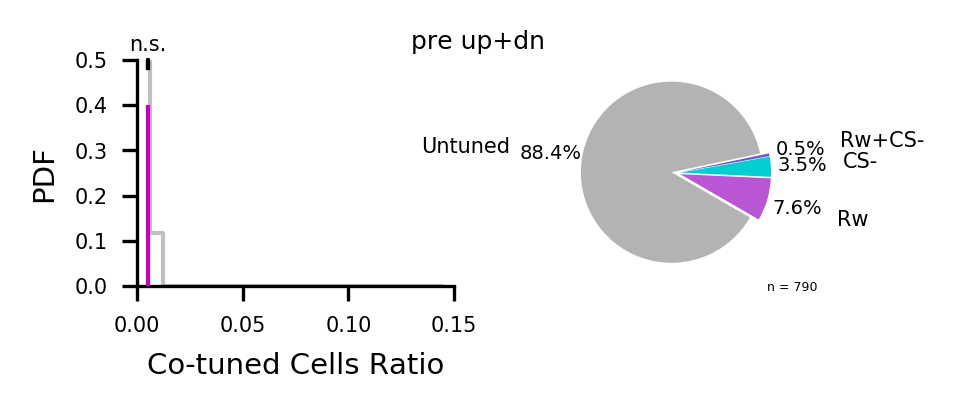

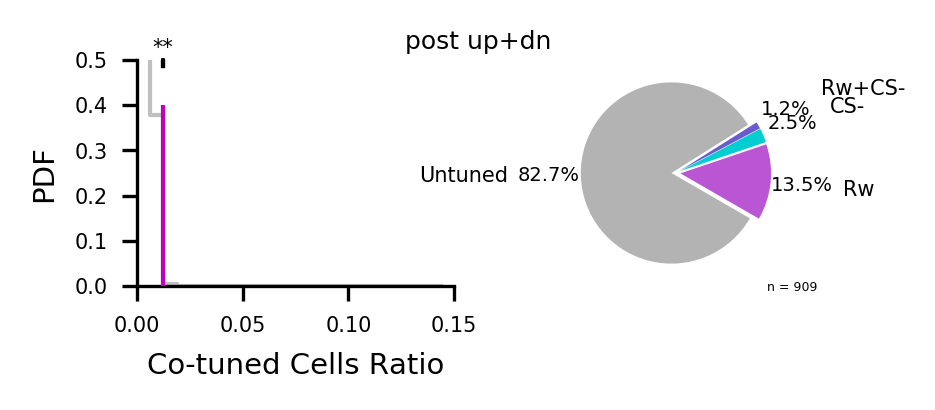

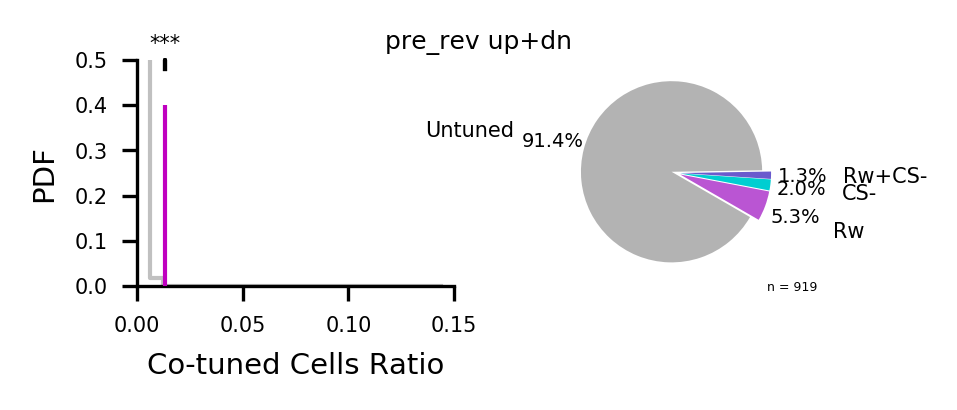

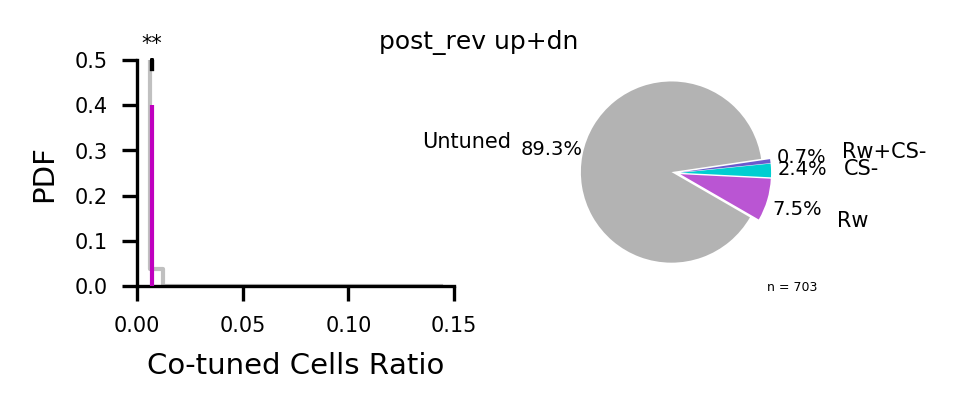

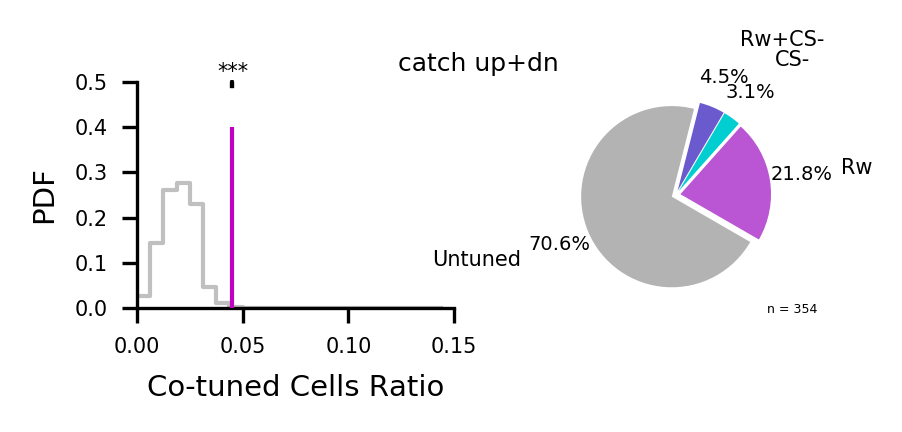

...

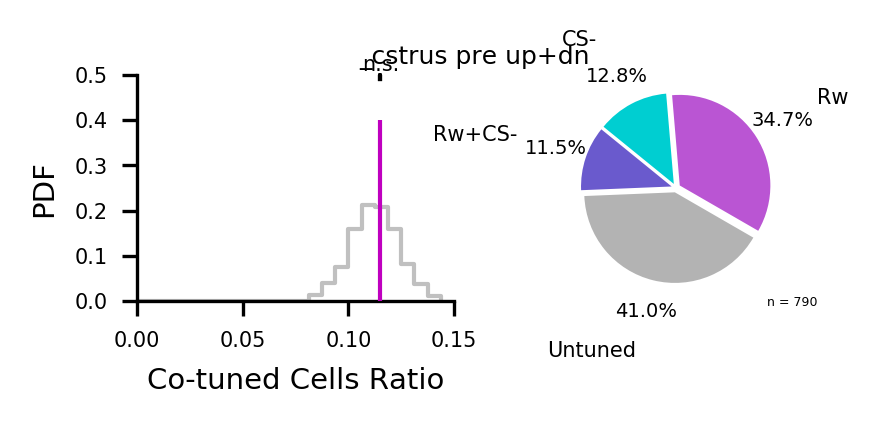

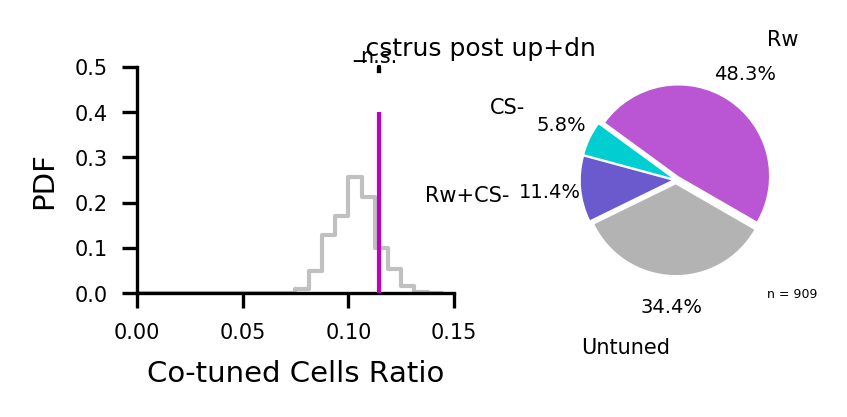

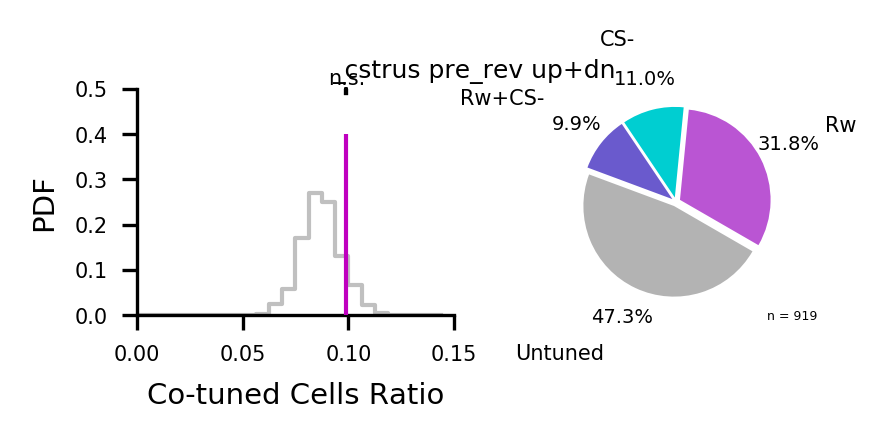

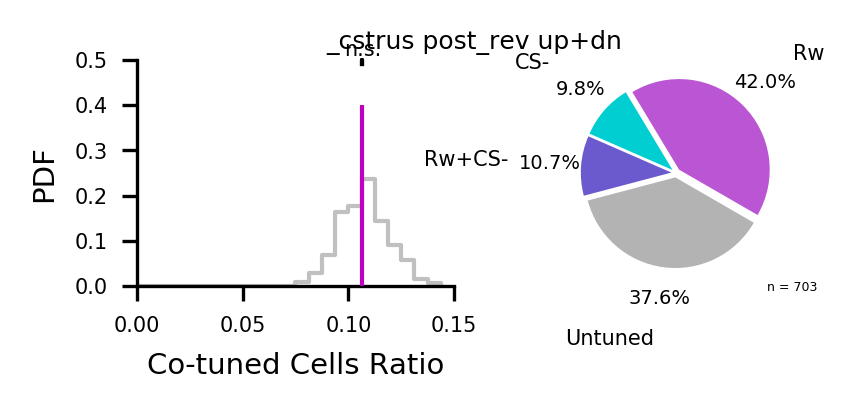

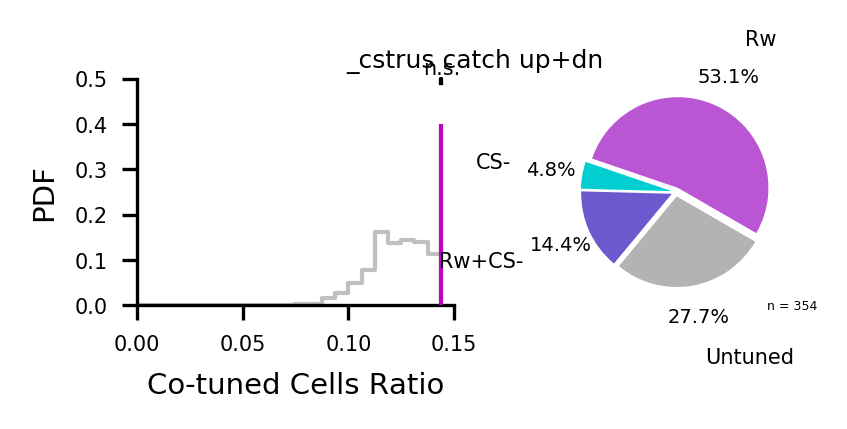

In [15]:
for f in feature:
    for s in session:
        comparison = '%s%s'%(s,f)
        pop1 = eval('cells_%srewardt%s_up' %(s,f)) + eval('cells_%srewardt%s_dn' %(s,f))
        pop2 = eval('cells_%sCSmt%s_up' %(s,f))+ eval('cells_%sCSmt%s_dn' %(s,f))
        unt = ~(pop1 + pop2)
        N = len(pop1)
        est = calc_shuffle_overlap(pop1, pop2, n_loops=n_loops, N=N)
        
        fig, axs = plot_it(pop1, pop2, unt, est, colors=['mediumorchid','darkturquoise','slateblue',(0.7, 0.7, 0.7)], hist_colors=['silver','m'],
                               title='%s %s up+dn'%(f,s),labels=['Rw','CS-', 'Rw+CS-', 'Untuned'])
        diff_from_chance_rew_vs_CSm_combined[comparison]=[np.mean(est),(pop1*pop2).mean(),((pop1*pop2).mean())-(np.mean(est)),
                          (((pop1*pop2).mean())-(np.mean(est)))/(np.mean(est)),
                          (((pop1*pop2).mean())-(np.mean(est)))/(np.std(est))]
#        fig.savefig('../img/overlaps/overlaps_upANDdn_CSp_v_CSm_%s%s.pdf' %(s,f))
#        np.savetxt('../img/overlaps/overlaps_upANDdn_CSp_v_CSm_%s%s.pvs' %(s,f), [pv[-1]], header='One-sided t-test')

In [ ]:
#use this to create a booklet
#!pdftk ../img/overlaps/overlaps_upANDdn_CSp_v_CSm_*.pdf cat output ../img/overlaps/booklets/overlaps_upANDdn_CSp_v_CSm_booklet.pdf

p-value =  [0.51149102122790557]
p-value =  [0.51149102122790557]
p-value =  [0.19638260082146197]
p-value =  [0.19638260082146197]
p-value =  [0.067633131645846278]
p-value =  [0.067633131645846278]
p-value =  [0.0024463108137798839]
p-value =  [0.0024463108137798839]
p-value =  [0.4603346505554351]
p-value =  [0.4603346505554351]
p-value =  [0.4678163607550041]
p-value =  [0.4678163607550041]
p-value =  [0.95048882034740545]
p-value =  [0.95048882034740545]
p-value =  [1.2340869315341507e-07]
p-value =  [1.2340869315341507e-07]
p-value =  [0.66014266223347517]
p-value =  [0.66014266223347517]
p-value =  [0.30392171136441593]
p-value =  [0.30392171136441593]
p-value =  [0.5623137710658721]
p-value =  [0.5623137710658721]
p-value =  [0.13278503882298476]
p-value =  [0.13278503882298476]
p-value =  [0.15896265932334697]
p-value =  [0.15896265932334697]
p-value =  [0.55328649318427692]
p-value =  [0.55328649318427692]
p-value =  [0.56960042658414067]
p-value =  [0.56960042658414067]
p-va

/home/fabios/anaconda2/lib/python2.7/site-packages/numpy/lib/function_base.py:824: RuntimeWarning: invalid value encountered in true_divide
  return n/(n*db).sum(), bins


p-value =  [0.22985313460696388]
p-value =  [0.22985313460696388]
p-value =  [0.040743727443329436]
p-value =  [0.040743727443329436]
p-value =  [0.10168786339372637]
p-value =  [0.10168786339372637]
p-value =  [0.25232510317216461]
p-value =  [0.25232510317216461]


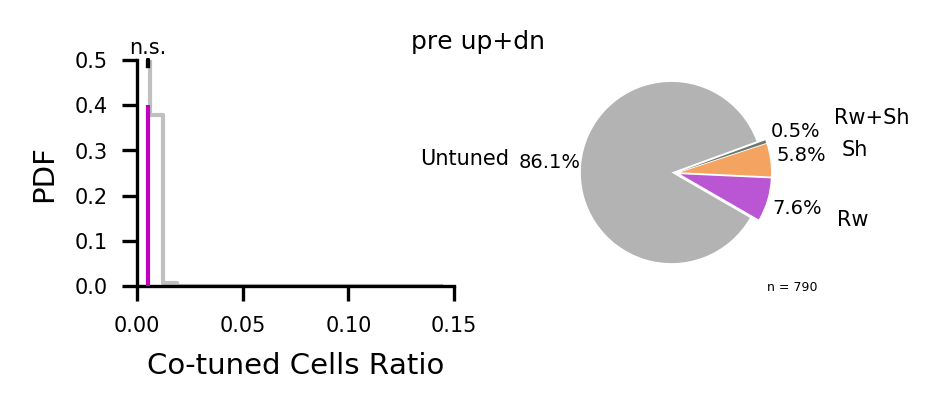

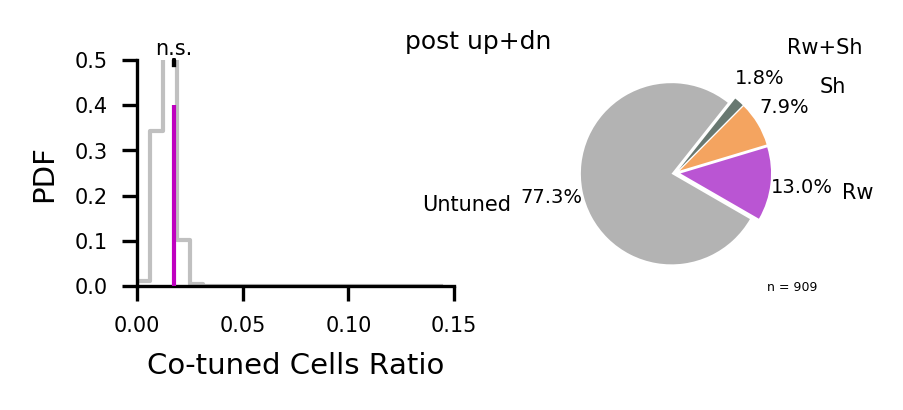

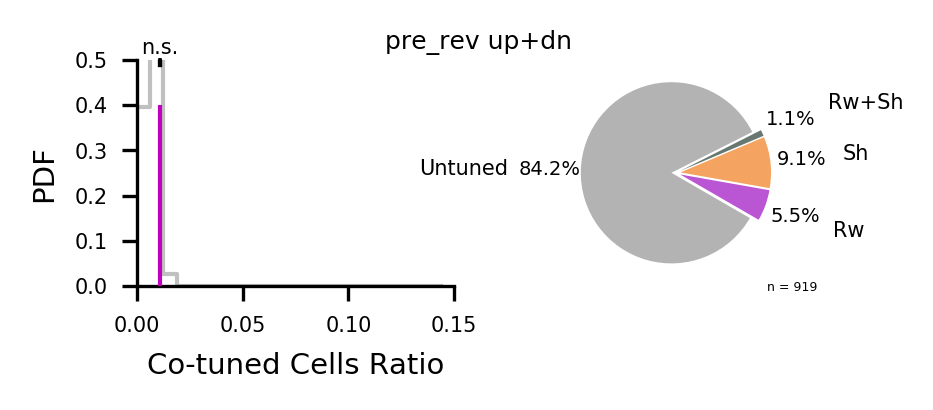

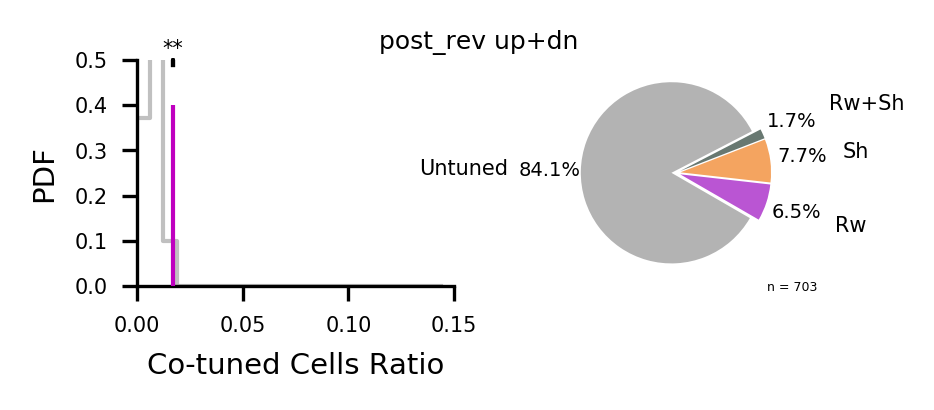

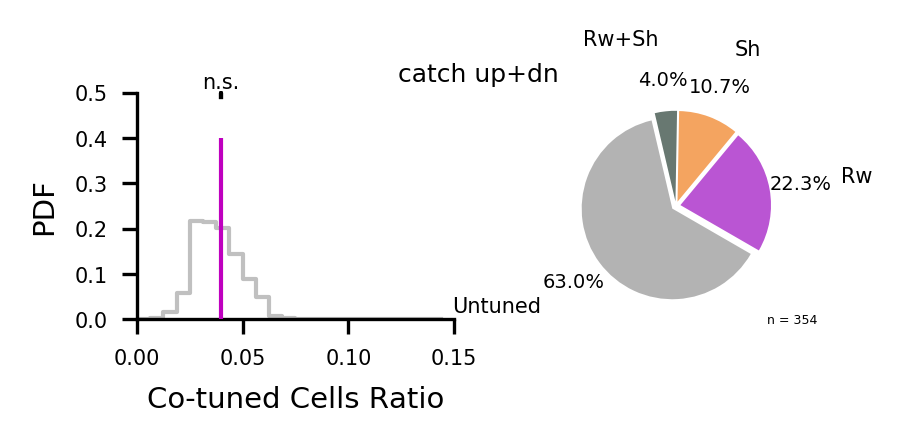

...

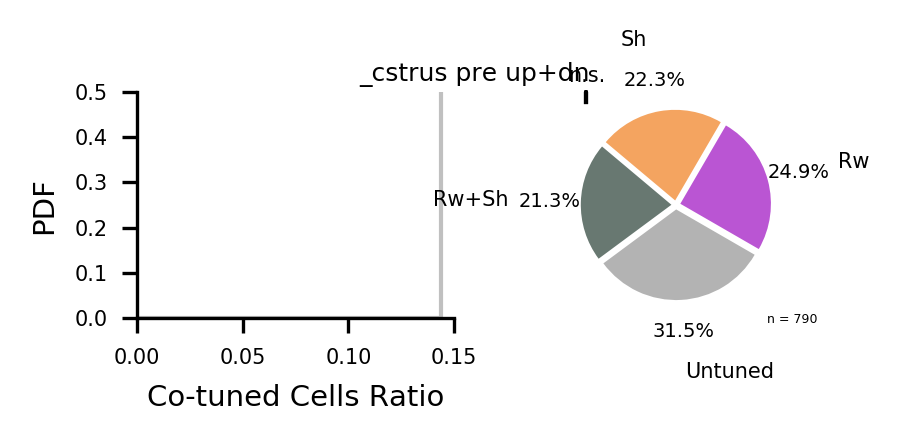

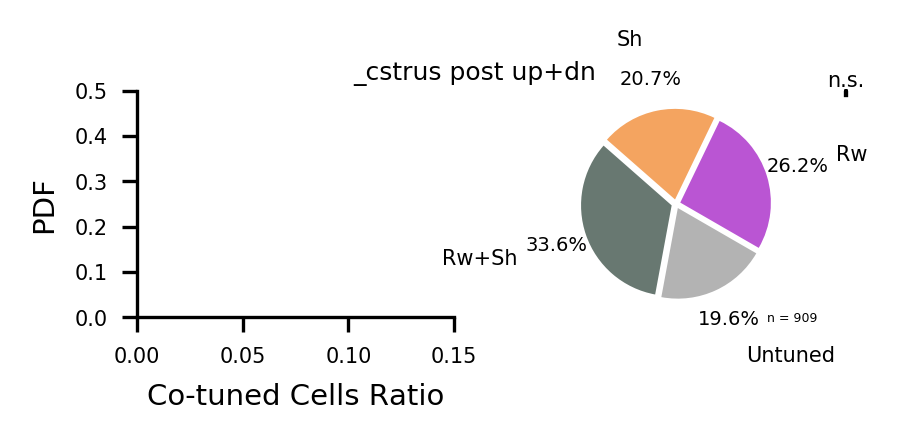

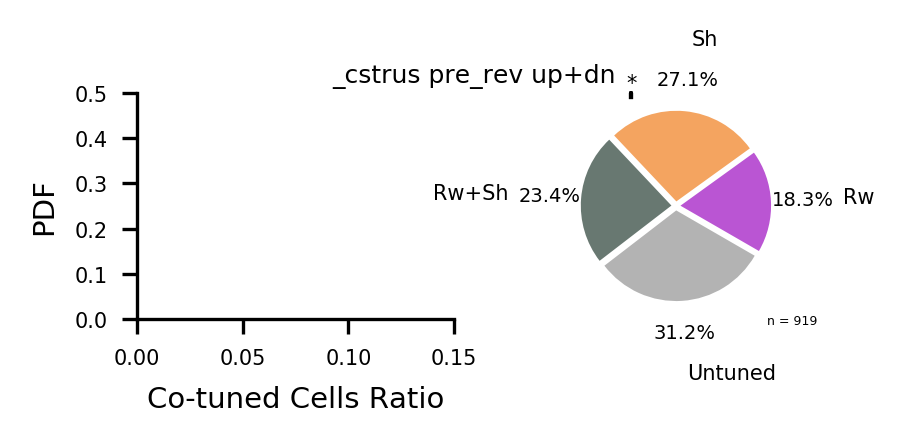

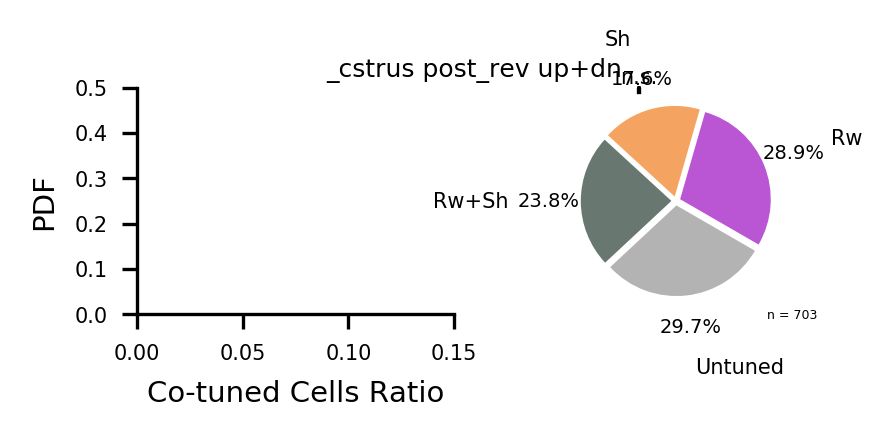

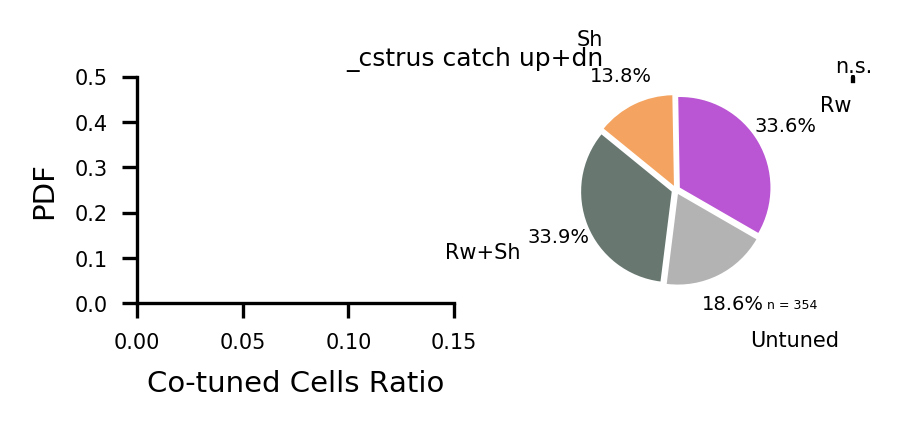

In [49]:
for f in feature:
    for s in session:
        comparison = '%s%s'%(s,f)
        pop1 = eval('cells_%srewardt%s_up' %(s,f)) + eval('cells_%srewardt%s_dn' %(s,f))
        pop2 = eval('cells_%ssht%s_up' %(s,f))+ eval('cells_%ssht%s_dn' %(s,f))
        unt = ~(pop1 + pop2)
        N = len(pop1)
        est = calc_shuffle_overlap(pop1, pop2, n_loops=n_loops, N=N)
        
        fig, axs = plot_it(pop1, pop2, unt, est, colors=['mediumorchid','sandybrown','#687871',(0.7, 0.7, 0.7)], hist_colors=['silver','m'],
                               title='%s %s up+dn'%(f,s),labels=['Rw','Sh', 'Rw+Sh', 'Untuned'])
        diff_from_chance_rew_vs_sh_combined[comparison]=[np.mean(est),(pop1*pop2).mean(),((pop1*pop2).mean())-(np.mean(est)),
                          (((pop1*pop2).mean())-(np.mean(est)))/(np.mean(est)),
                          (((pop1*pop2).mean())-(np.mean(est)))/(np.std(est))]
#        fig.savefig('../img/overlaps/overlaps_upANDdn_CSp_v_CSm_%s%s.pdf' %(s,f))
#        np.savetxt('../img/overlaps/overlaps_upANDdn_CSp_v_CSm_%s%s.pvs' %(s,f), [pv[-1]], header='One-sided t-test')

p-value =  [0.0027192180140032107]
p-value =  [0.0027192180140032107]
p-value =  [1.3975487433981471e-12]
p-value =  [1.3975487433981471e-12]
p-value =  [0.00033476733655579682]
p-value =  [0.00033476733655579682]
p-value =  [1.7285304049652339e-05]
p-value =  [1.7285304049652339e-05]
p-value =  [2.1254068125697856e-05]
p-value =  [2.1254068125697856e-05]
p-value =  [0.66602602356444096]
p-value =  [0.66602602356444096]
p-value =  [0.62739022003196143]
p-value =  [0.62739022003196143]
p-value =  [0.18070403212237296]
p-value =  [0.18070403212237296]
p-value =  [0.54692862050580016]
p-value =  [0.54692862050580016]
p-value =  [nan]
p-value =  [nan]


/home/fabios/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in double_scalars
/home/fabios/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:14: RuntimeWarning: invalid value encountered in double_scalars


p-value =  [0.056491097006346913]
p-value =  [0.056491097006346913]
p-value =  [0.018009632786467611]
p-value =  [0.018009632786467611]
p-value =  [0.021880846802014631]
p-value =  [0.021880846802014631]
p-value =  [0.18115246339904467]
p-value =  [0.18115246339904467]
p-value =  [0.24131401184625001]
p-value =  [0.24131401184625001]
p-value =  [0.0017925347835955341]
p-value =  [0.0017925347835955341]
p-value =  [nan]
p-value =  [nan]
p-value =  [0.66908139669147815]
p-value =  [0.66908139669147815]
p-value =  [nan]
p-value =  [nan]
p-value =  [nan]
p-value =  [nan]
p-value =  [0.13481817399143536]
p-value =  [0.13481817399143536]
p-value =  [0.15659954884862004]
p-value =  [0.15659954884862004]
p-value =  [0.54295191209263449]
p-value =  [0.54295191209263449]
p-value =  [0.13100504899714882]
p-value =  [0.13100504899714882]
p-value =  [0.058459432075736562]
p-value =  [0.058459432075736562]


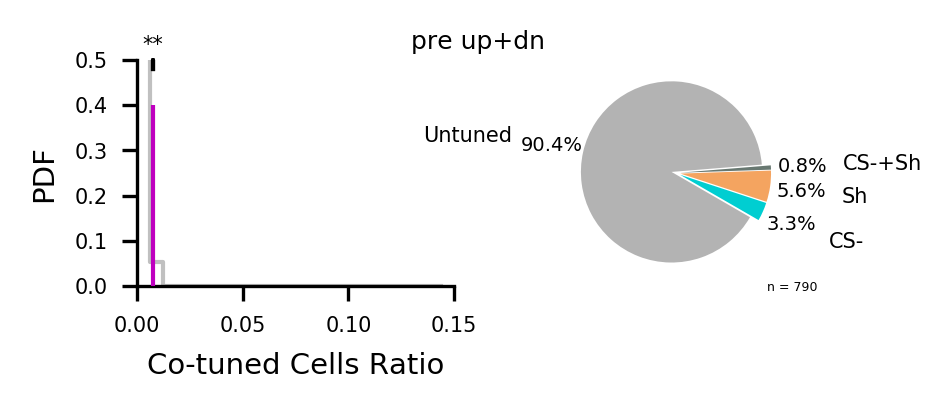

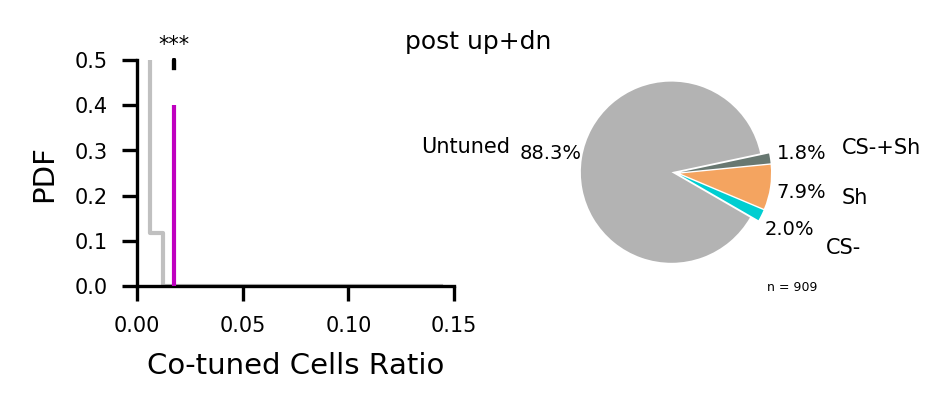

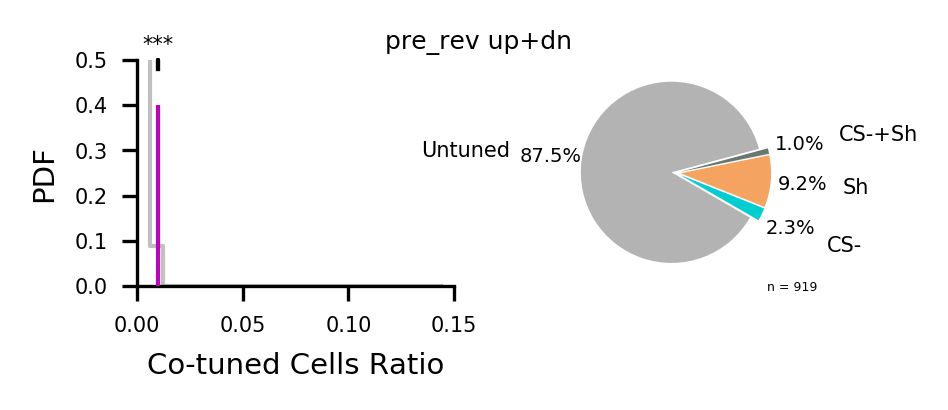

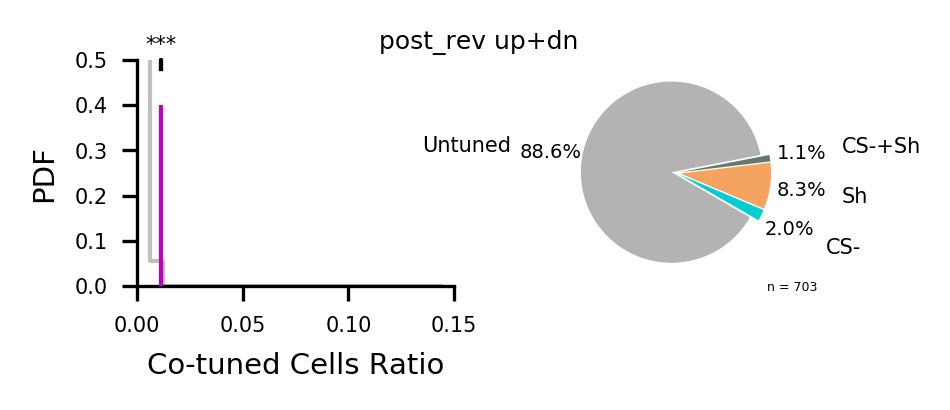

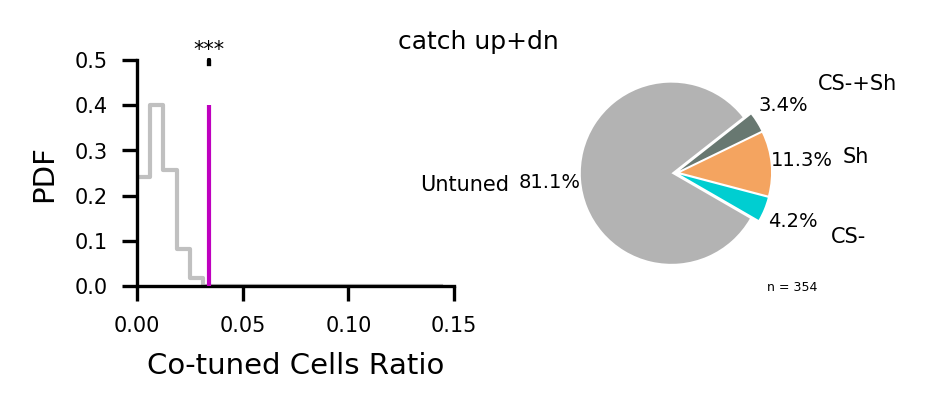

...

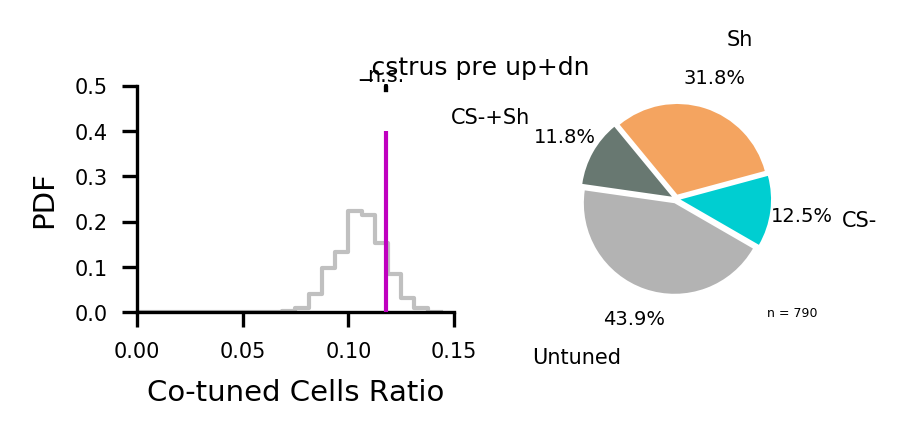

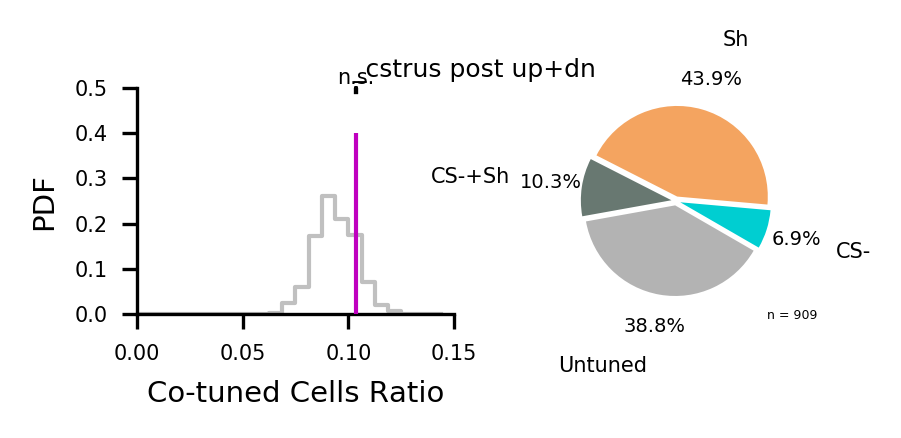

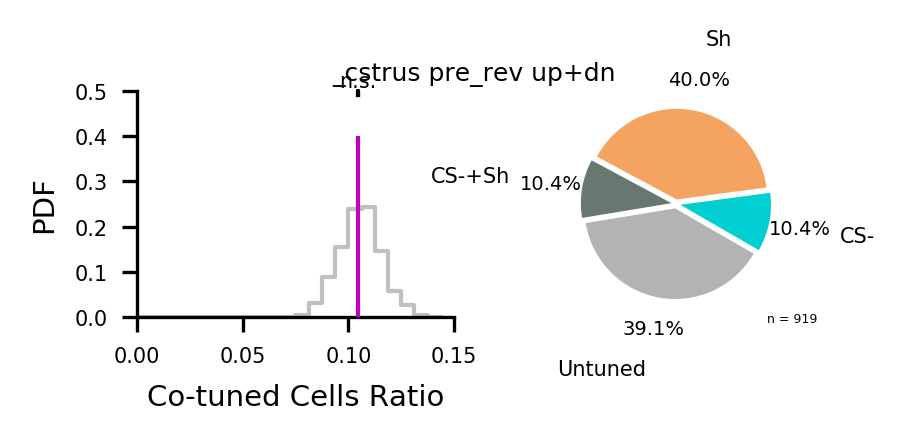

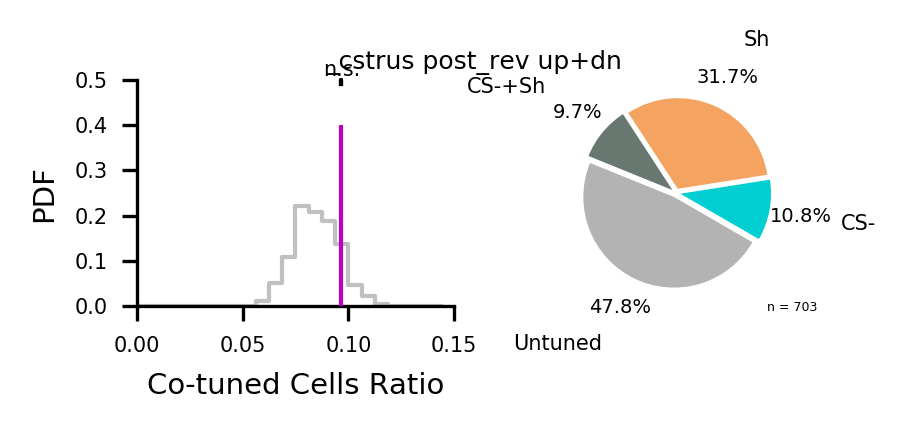

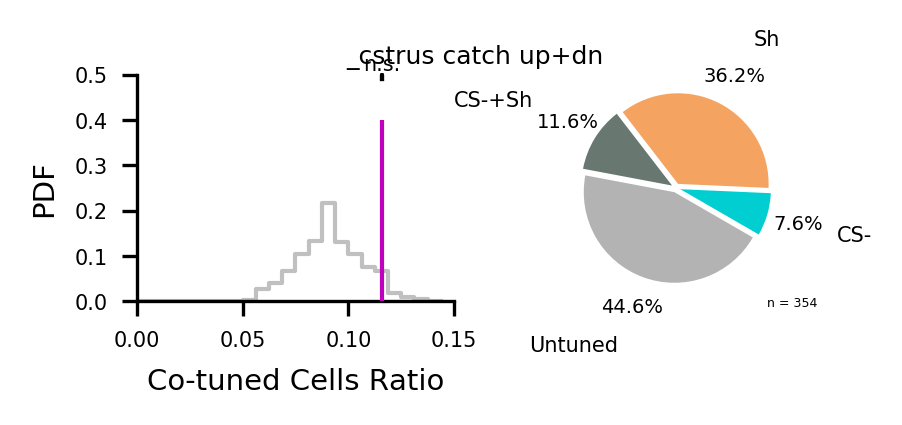

In [50]:
for f in feature:
    for s in session:
        comparison = '%s%s'%(s,f)
        pop1 = eval('cells_%sCSmt%s_up' %(s,f)) + eval('cells_%sCSmt%s_dn' %(s,f))
        pop2 = eval('cells_%ssht%s_up' %(s,f))+ eval('cells_%ssht%s_dn' %(s,f))
        unt = ~(pop1 + pop2)
        N = len(pop1)
        est = calc_shuffle_overlap(pop1, pop2, n_loops=n_loops, N=N)
        
        fig, axs = plot_it(pop1, pop2, unt, est, colors=['darkturquoise','sandybrown','#687871',(0.7, 0.7, 0.7)], hist_colors=['silver','m'],
                               title='%s %s up+dn'%(f,s),labels=['CS-','Sh', 'CS-+Sh', 'Untuned'])
        diff_from_chance_rew_vs_sh_combined[comparison]=[np.mean(est),(pop1*pop2).mean(),((pop1*pop2).mean())-(np.mean(est)),
                          (((pop1*pop2).mean())-(np.mean(est)))/(np.mean(est)),
                          (((pop1*pop2).mean())-(np.mean(est)))/(np.std(est))]
#        fig.savefig('../img/overlaps/overlaps_upANDdn_CSp_v_CSm_%s%s.pdf' %(s,f))
#        np.savetxt('../img/overlaps/overlaps_upANDdn_CSp_v_CSm_%s%s.pvs' %(s,f), [pv[-1]], header='One-sided t-test')

CS+ vs CSm trials, up and down separated

p-value =  [0.21054376534069985]
p-value =  [0.21054376534069985]
p-value =  [0.59198263449308797]
p-value =  [0.59198263449308797]
p-value =  [0.00018137706263765541]
p-value =  [0.00018137706263765541]
p-value =  [0.63596452106774259]
p-value =  [0.63596452106774259]
p-value =  [3.6193270602780103e-14]
p-value =  [3.6193270602780103e-14]
p-value =  [0.56099131131941582]
p-value =  [0.56099131131941582]
p-value =  [0.001214252727510412]
p-value =  [0.001214252727510412]
p-value =  [0.56235440739451015]
p-value =  [0.56235440739451015]
p-value =  [0.00026696400850645396]
p-value =  [0.00026696400850645396]
p-value =  [0.64923410865683762]
p-value =  [0.64923410865683762]
p-value =  [0.625614089897784]
p-value =  [0.625614089897784]
p-value =  [0.58853934830844801]
p-value =  [0.58853934830844801]
p-value =  [0.83244597978211177]
p-value =  [0.83244597978211177]
p-value =  [nan]
p-value =  [nan]


/home/fabios/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:14: RuntimeWarning: invalid value encountered in double_scalars
/home/fabios/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in double_scalars


p-value =  [0.67399810096586299]
p-value =  [0.67399810096586299]
p-value =  [0.53963083239778864]
p-value =  [0.53963083239778864]
p-value =  [0.63792351851980411]
p-value =  [0.63792351851980411]
p-value =  [nan]
p-value =  [nan]
p-value =  [nan]
p-value =  [nan]
p-value =  [nan]
p-value =  [nan]
p-value =  [0.25672389219317238]
p-value =  [0.25672389219317238]
p-value =  [0.44257518911154314]
p-value =  [0.44257518911154314]
p-value =  [0.0015644571618320668]
p-value =  [0.0015644571618320668]
p-value =  [0.00031567823685207941]
p-value =  [0.00031567823685207941]
p-value =  [0.00024625648654752474]
p-value =  [0.00024625648654752474]
p-value =  [0.063741986522495964]
p-value =  [0.063741986522495964]
p-value =  [0.0068537830543997647]
p-value =  [0.0068537830543997647]
p-value =  [0.00021510614798914141]
p-value =  [0.00021510614798914141]
p-value =  [0.0082105372709352364]
p-value =  [0.0082105372709352364]
p-value =  [0.53384505626595991]
p-value =  [0.53384505626595991]
p-value 

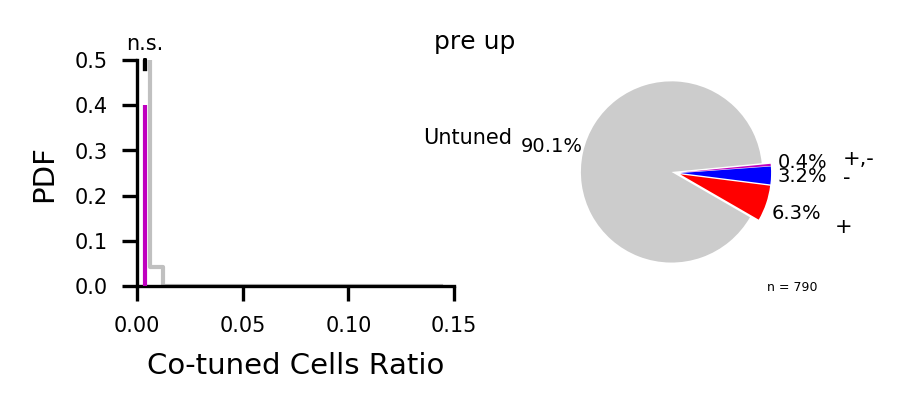

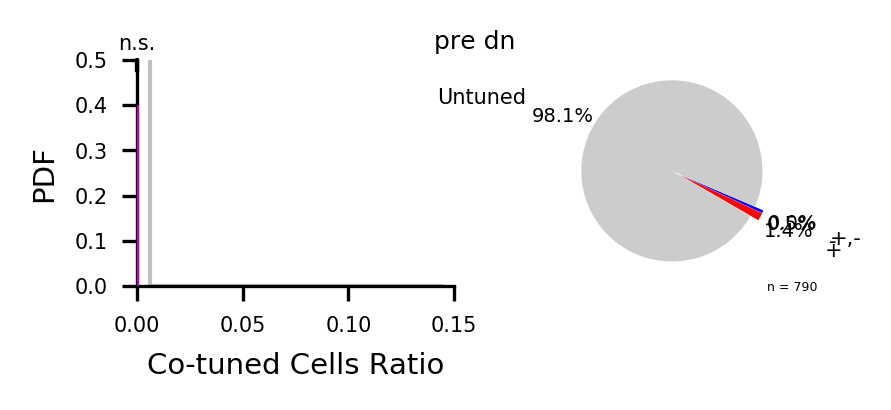

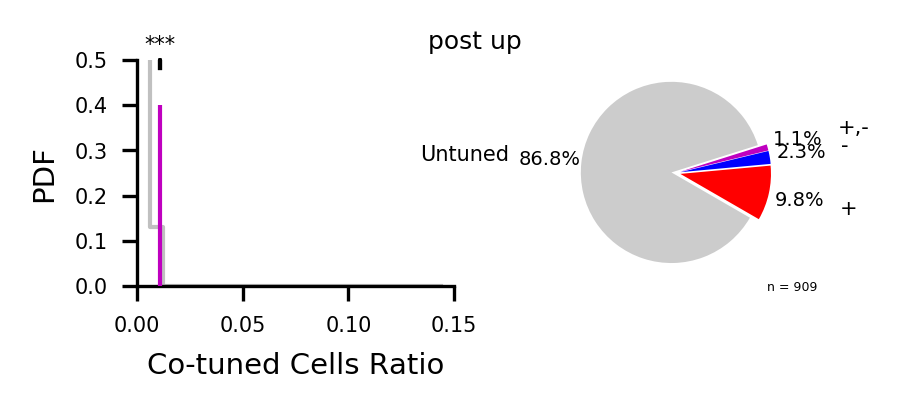

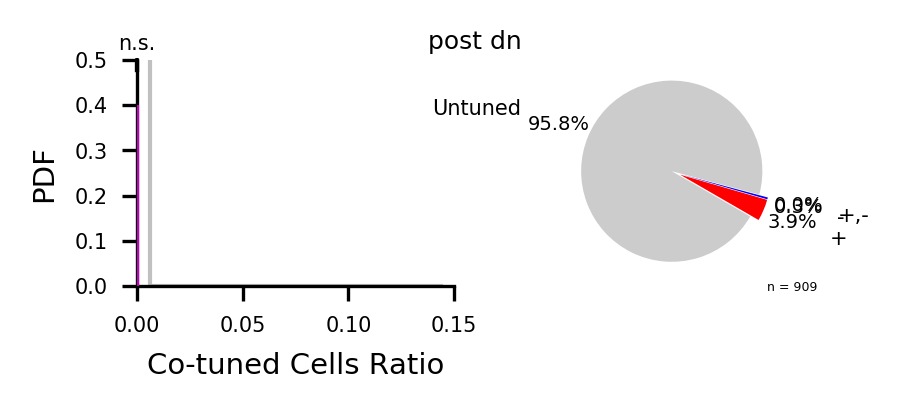

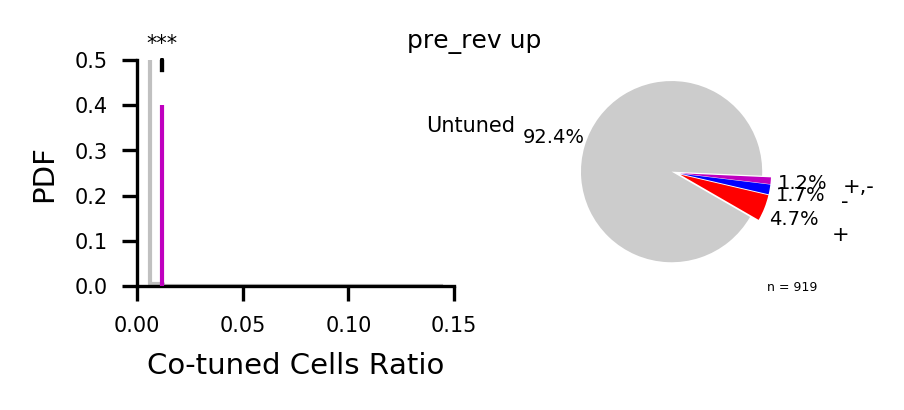

...

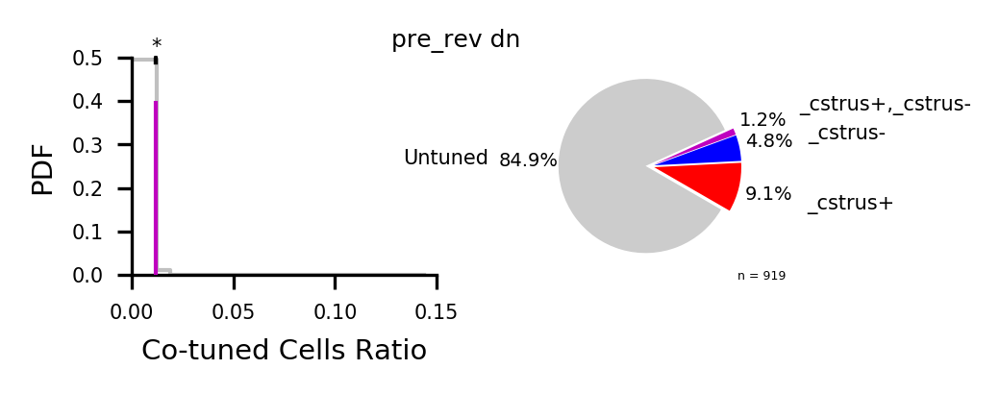

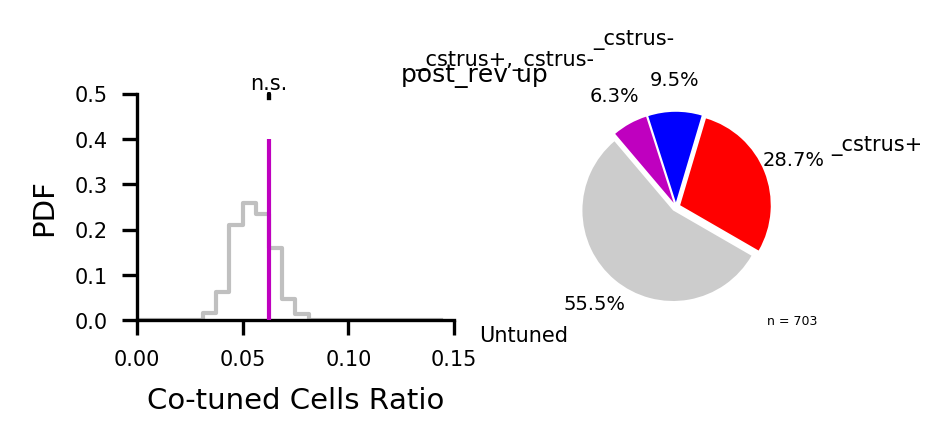

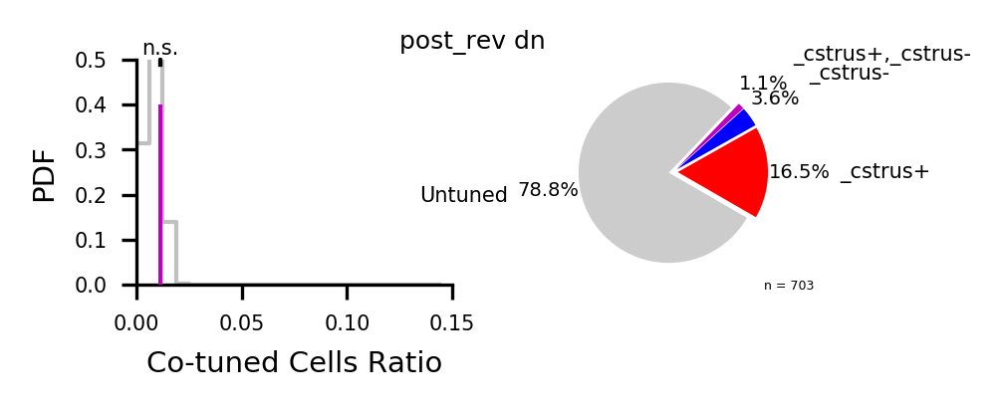

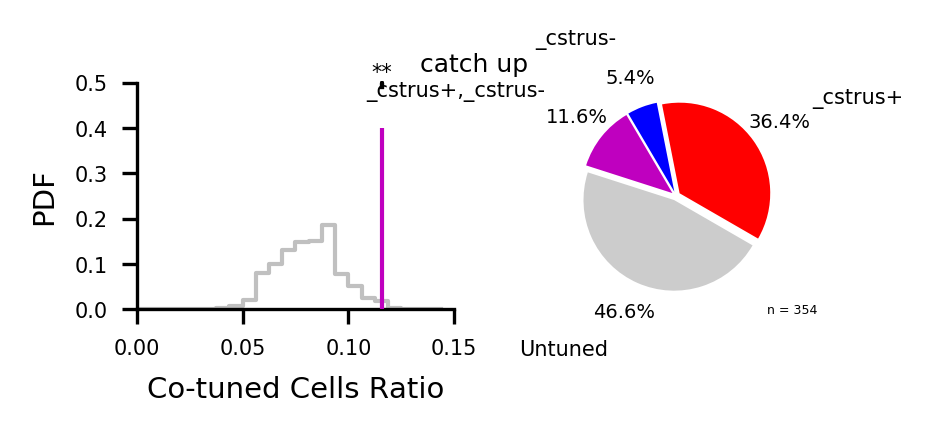

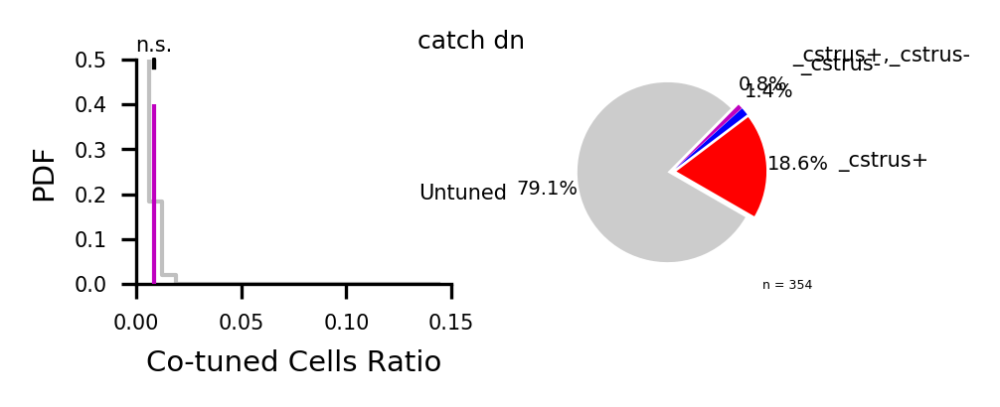

In [51]:
for f in feature:
    for s in session:
        for d in direction:
            comparison = '%s%s_%s'%(s,f,d)
            pop1 = eval('cells_%srewardt%s_%s' %(s,f,d))
            pop2 = eval('cells_%sCSmt%s_%s' %(s,f,d))
            unt = ~(pop1 + pop2)
            N = len(pop1)
            est = calc_shuffle_overlap(pop1, pop2, n_loops=n_loops, N=N)
            
            fig, axs = plot_it(pop1, pop2, unt, est, colors=['r','b','m',(0.8, 0.8, 0.8)], hist_colors=['silver','m'],
                                   title='%s %s' %(s,d),labels=['%s+' %(f),'%s-' %(f), '%s+,%s-' %(f,f), 'Untuned'])
            diff_from_chance_rew_vs_CSm[comparison]=[np.mean(est),(pop1*pop2).mean(),((pop1*pop2).mean())-(np.mean(est)),
                          (((pop1*pop2).mean())-(np.mean(est)))/(np.mean(est)),
                          (((pop1*pop2).mean())-(np.mean(est)))/(np.std(est))]
           
    #        fig.savefig('../img/overlaps/overlaps_%s_CSp_v_CSm_%s_%s.pdf' %(d,s,f))
#            np.savetxt('../img/overlaps/overlaps_%s_CSp_v_CSm_%s_%s.pvs' %(d,s,f), [pv[-1]], header='One-sided t-test')        

In [52]:
#use this to create a booklet
#!pdftk ../img/overlaps/overlaps_up_or_dn_CSp_v_CSm_*.pdf cat output ../img/overlaps/booklets/overlaps_up_CSp_v_CSm_booklet.pdf

p-value =  [0.75212996057350923]
p-value =  [0.75212996057350923]
p-value =  [0.45310025037097834]
p-value =  [0.45310025037097834]
p-value =  [0.84165950340087836]
p-value =  [0.84165950340087836]
p-value =  [0.7867760985161798]
p-value =  [0.7867760985161798]
p-value =  [0.91885076324910675]
p-value =  [0.91885076324910675]
p-value =  [0.80366586384207994]
p-value =  [0.80366586384207994]
p-value =  [0.90949309030637315]
p-value =  [0.90949309030637315]
p-value =  [0.087450968726924816]
p-value =  [0.087450968726924816]
p-value =  [0.80559657974760479]
p-value =  [0.80559657974760479]
p-value =  [0.19812936899612432]
p-value =  [0.19812936899612432]
p-value =  [0.99835143018781836]
p-value =  [0.99835143018781836]
p-value =  [0.90842812165964226]
p-value =  [0.90842812165964226]
p-value =  [0.9682955462996824]
p-value =  [0.9682955462996824]
p-value =  [0.91393684321697388]
p-value =  [0.91393684321697388]
p-value =  [0.99751065008483886]
p-value =  [0.99751065008483886]
p-value =  [

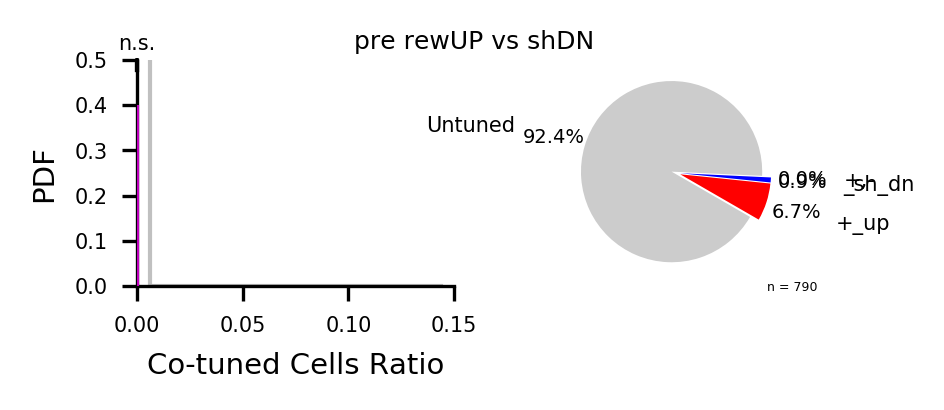

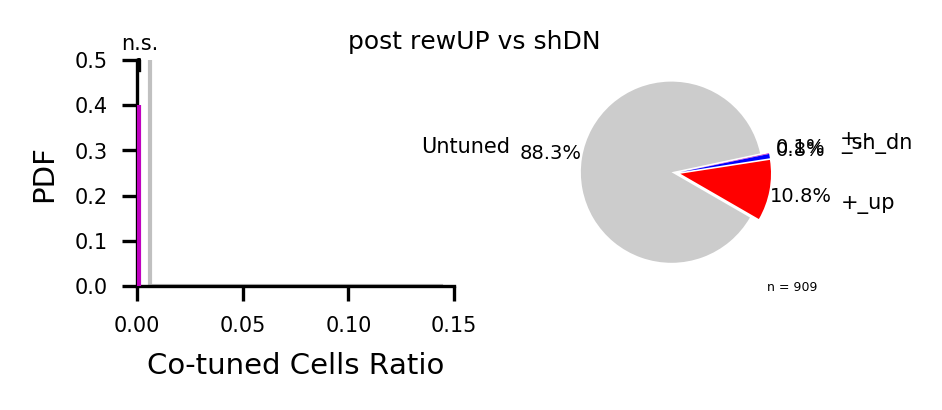

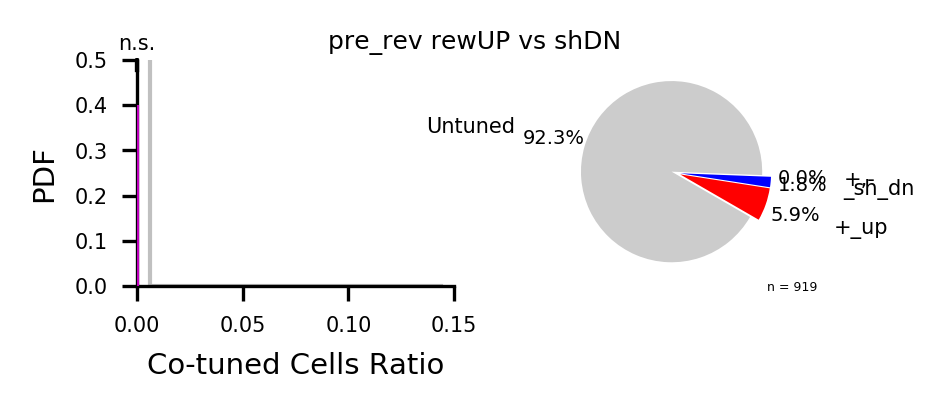

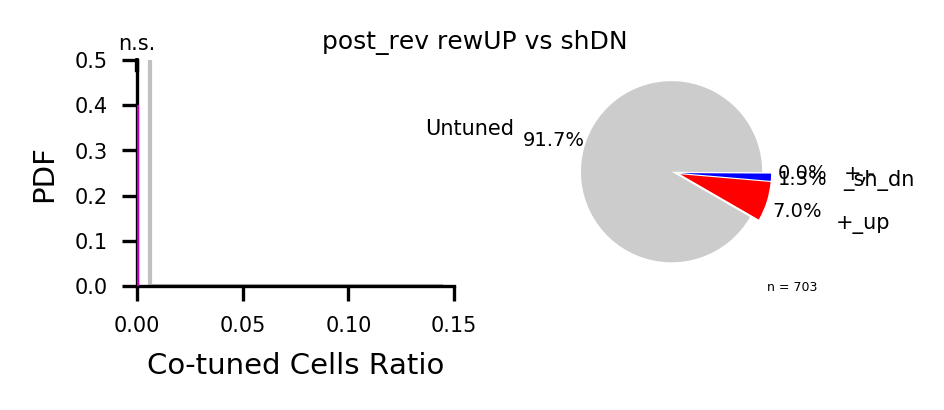

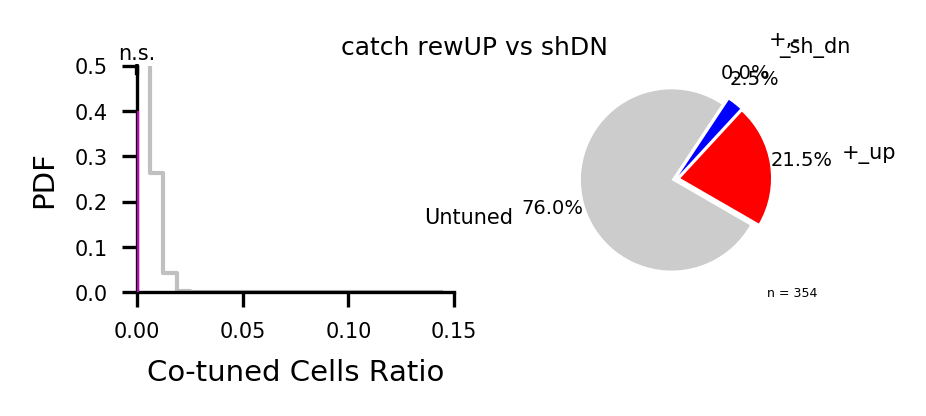

...

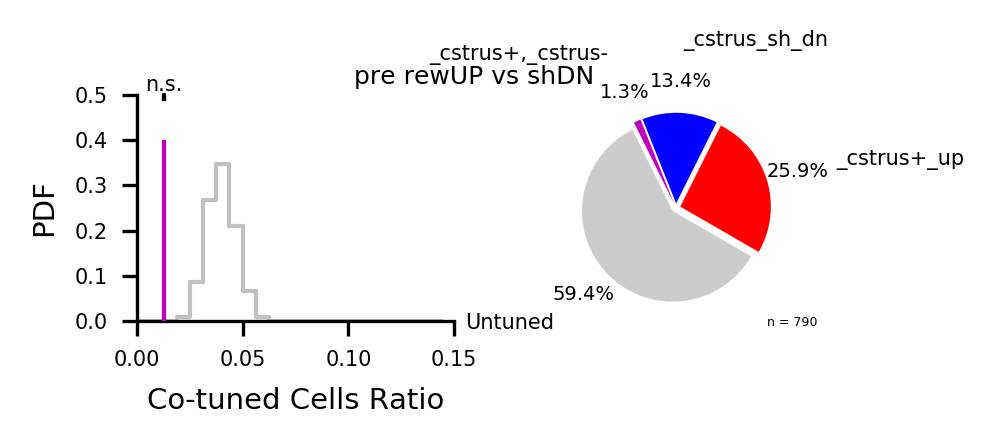

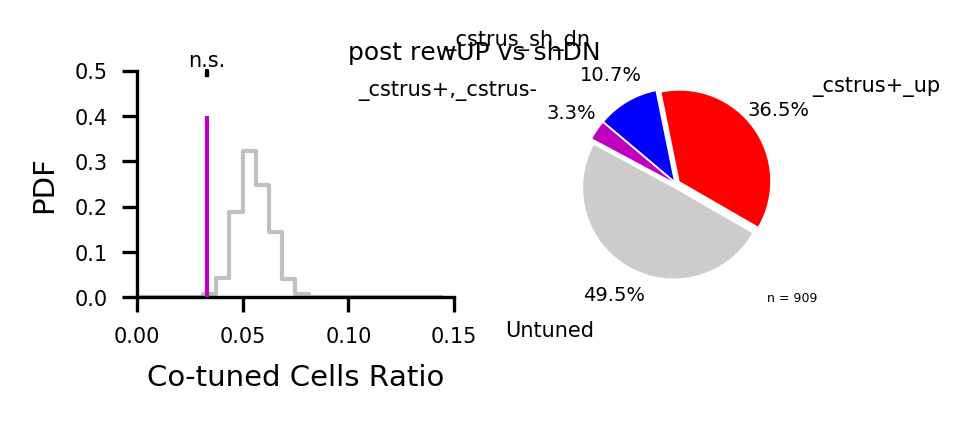

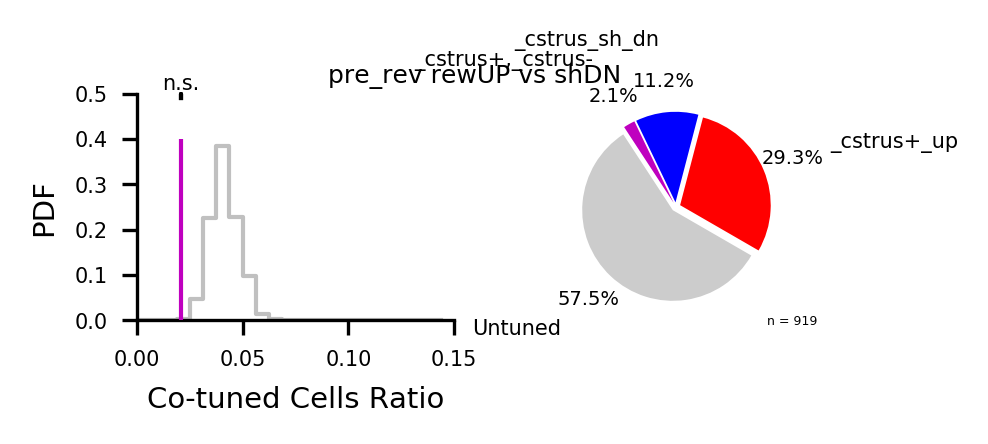

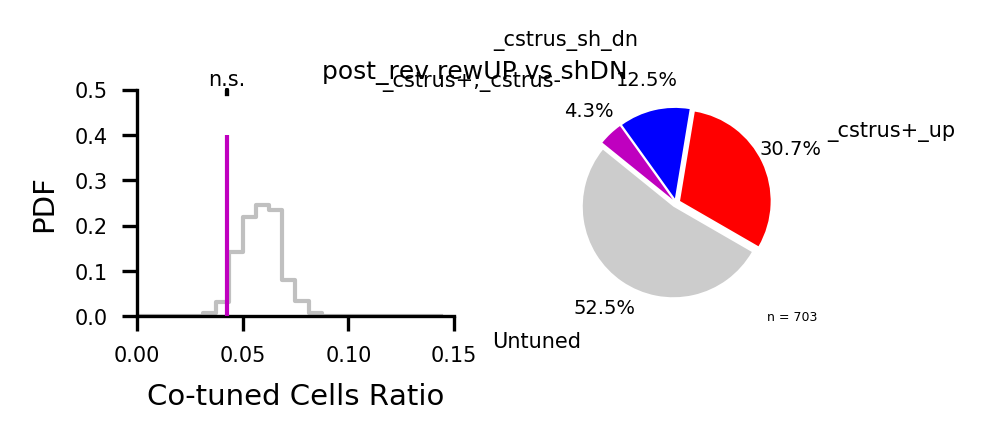

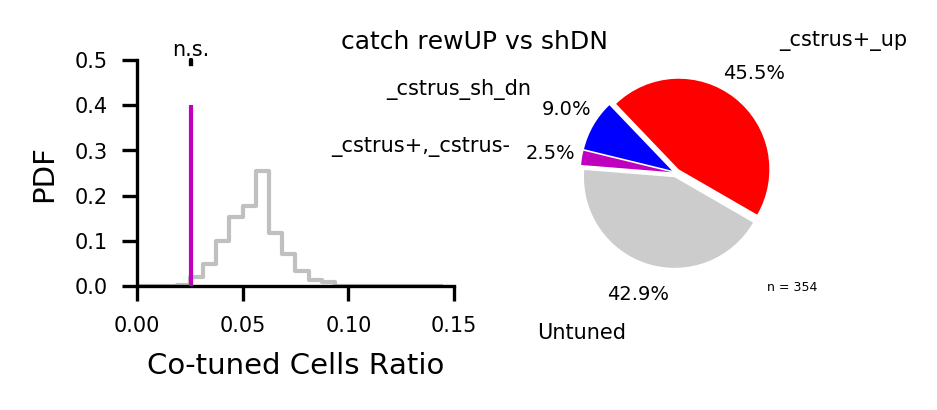

In [44]:
for f in feature:
    for s in session:
            comparison = '%s%s_upVSdn'%(s,f)
            pop1 = eval('cells_%srewardt%s_up' %(s,f))
            pop2 = eval('cells_%ssht%s_dn' %(s,f))
            unt = ~(pop1 + pop2)
            N = len(pop1)
            est = calc_shuffle_overlap(pop1, pop2, n_loops=n_loops, N=N)
            
            fig, axs = plot_it(pop1, pop2, unt, est, colors=['r','b','m',(0.8, 0.8, 0.8)], hist_colors=['silver','m'],
                                   title='%s rewUP vs shDN' %(s),labels=['%s+_up' %(f),'%s_sh_dn' %(f), '%s+,%s-' %(f,f), 'Untuned'])
            diff_from_chance_rewUP_vs_shDN[comparison]=[np.mean(est),(pop1*pop2).mean(),((pop1*pop2).mean())-(np.mean(est)),
                          (((pop1*pop2).mean())-(np.mean(est)))/(np.mean(est)),
                          (((pop1*pop2).mean())-(np.mean(est)))/(np.std(est))]
           
    #        fig.savefig('../img/overlaps/overlaps_%s_CSp_v_CSm_%s_%s.pdf' %(d,s,f))
#            np.savetxt('../img/overlaps/overlaps_%s_CSp_v_CSm_%s_%s.pvs' %(d,s,f), [pv[-1]], header='One-sided t-test')        

p-value =  [0.78251132119407063]
p-value =  [0.78251132119407063]
p-value =  [0.96005629698834838]
p-value =  [0.96005629698834838]
p-value =  [0.78171619374804013]
p-value =  [0.78171619374804013]
p-value =  [0.37047942352805707]
p-value =  [0.37047942352805707]
p-value =  [0.92636340761744729]
p-value =  [0.92636340761744729]
p-value =  [0.056108216778847031]
p-value =  [0.056108216778847031]
p-value =  [0.76073336753160303]
p-value =  [0.76073336753160303]
p-value =  [0.76862643687078469]
p-value =  [0.76862643687078469]
p-value =  [0.62238006868992379]
p-value =  [0.62238006868992379]
p-value =  [0.66654928669838209]
p-value =  [0.66654928669838209]
p-value =  [0.89626197866384905]
p-value =  [0.89626197866384905]
p-value =  [0.98664736247433027]
p-value =  [0.98664736247433027]
p-value =  [0.86171608294886626]
p-value =  [0.86171608294886626]
p-value =  [0.99213380356469671]
p-value =  [0.99213380356469671]
p-value =  [0.99077024366193267]
p-value =  [0.99077024366193267]
p-value 

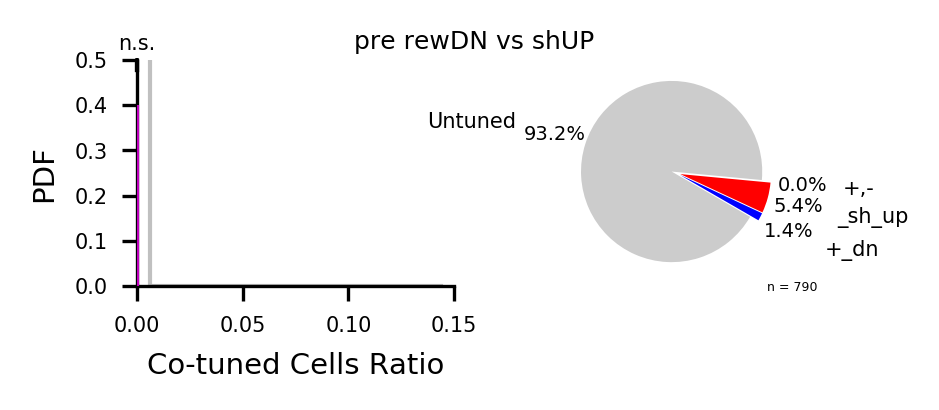

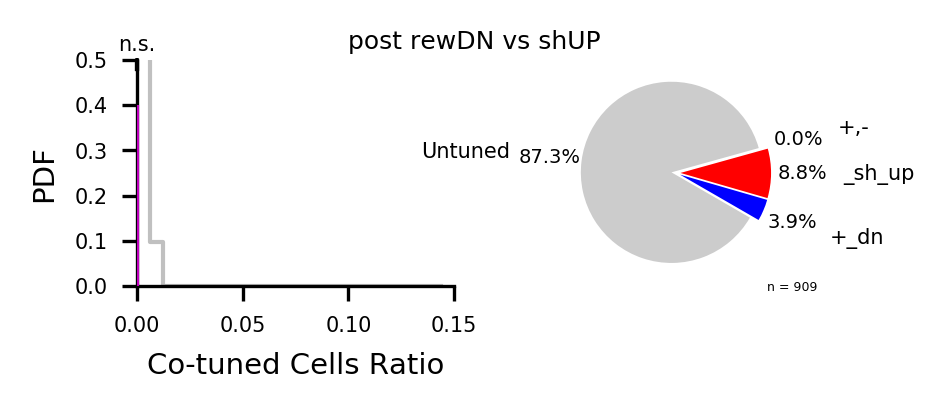

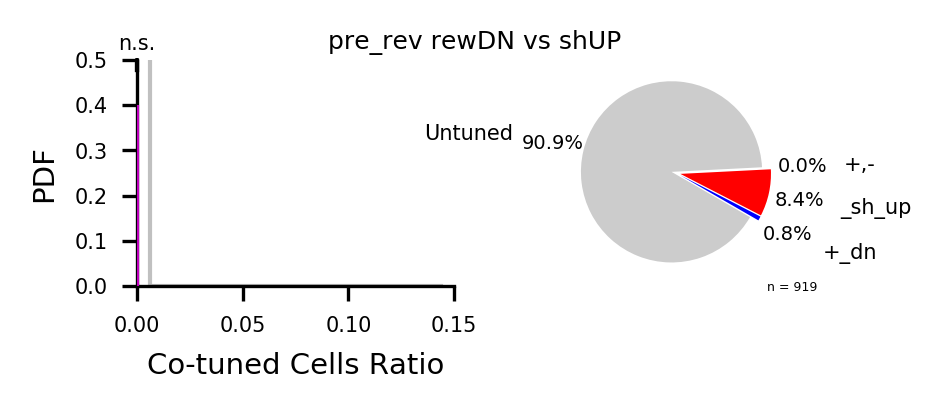

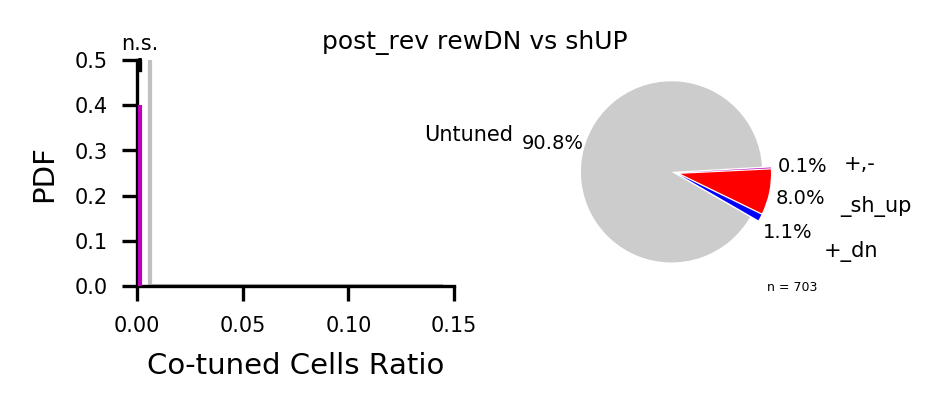

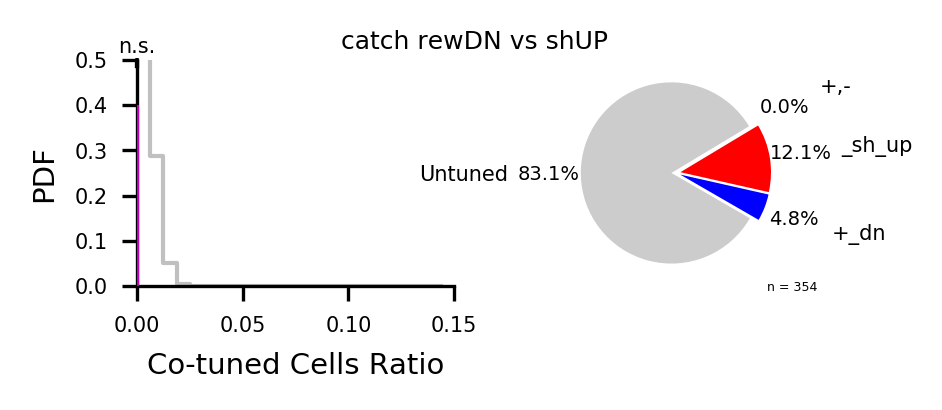

...

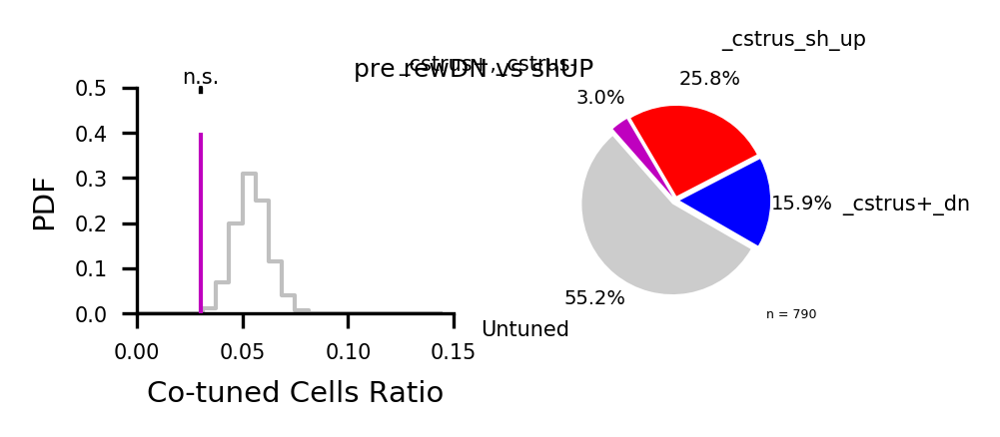

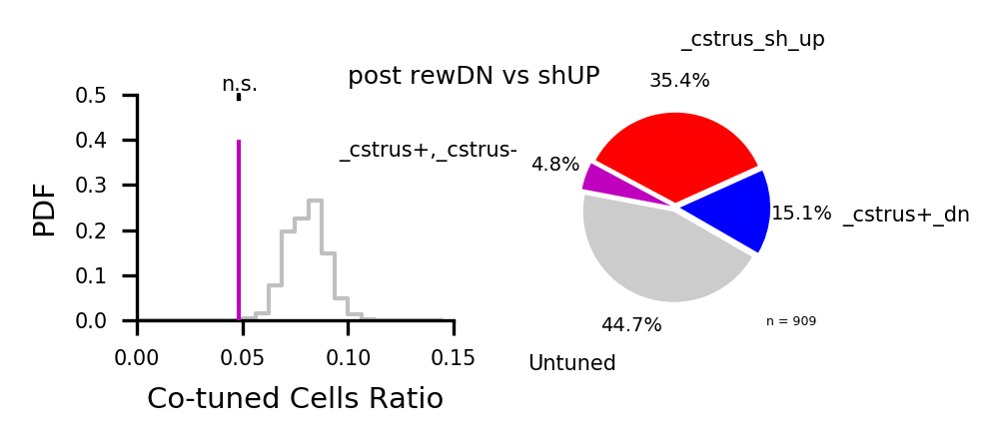

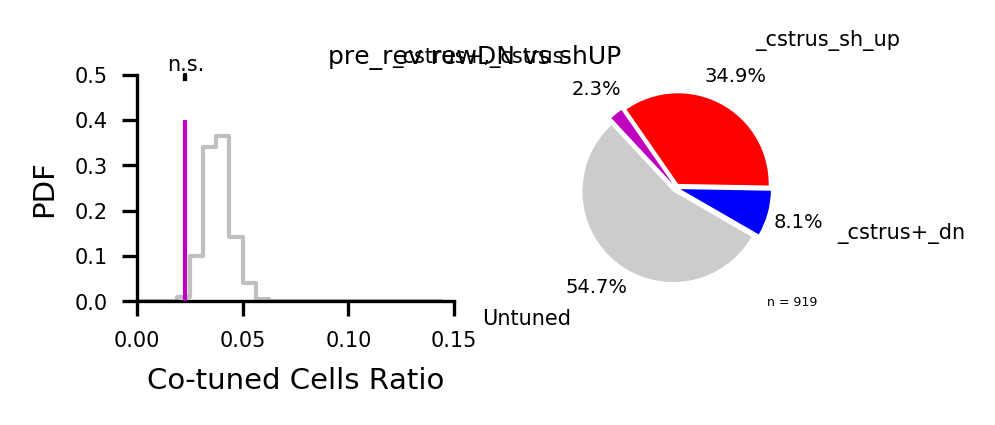

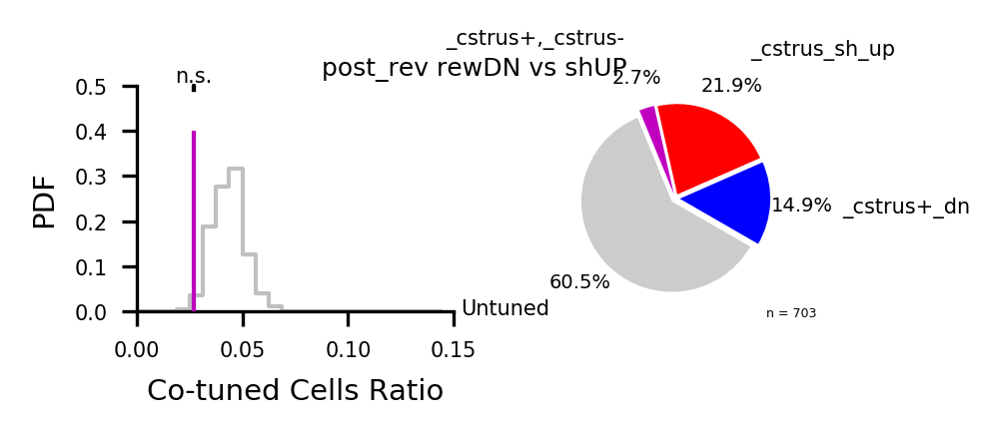

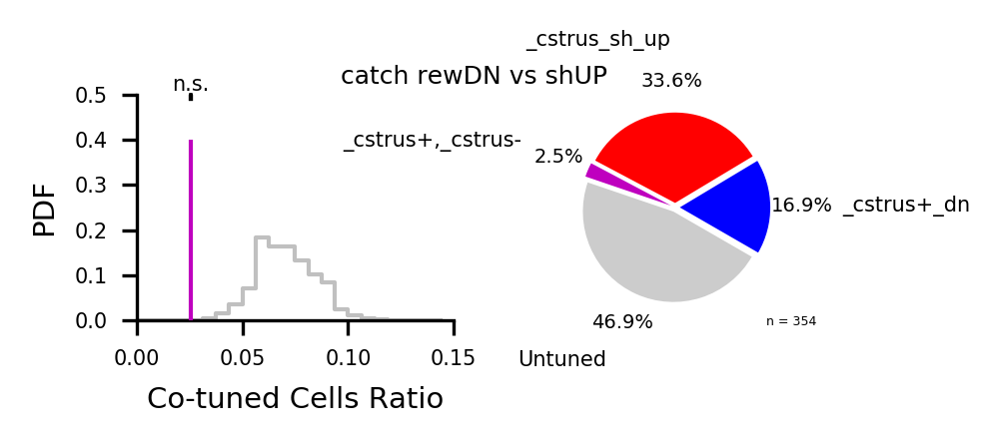

In [45]:
for f in feature:
    for s in session:
            comparison = '%s%s_dnVSup'%(s,f)
            pop1 = eval('cells_%srewardt%s_dn' %(s,f))
            pop2 = eval('cells_%ssht%s_up' %(s,f))
            unt = ~(pop1 + pop2)
            N = len(pop1)
            est = calc_shuffle_overlap(pop1, pop2, n_loops=n_loops, N=N)
            
            fig, axs = plot_it(pop1, pop2, unt, est, colors=['b','r','m',(0.8, 0.8, 0.8)], hist_colors=['silver','m'],
                                   title='%s rewDN vs shUP' %(s),labels=['%s+_dn' %(f),'%s_sh_up' %(f), '%s+,%s-' %(f,f), 'Untuned'])
            diff_from_chance_rewDN_vs_shUP[comparison]=[np.mean(est),(pop1*pop2).mean(),((pop1*pop2).mean())-(np.mean(est)),
                          (((pop1*pop2).mean())-(np.mean(est)))/(np.mean(est)),
                          (((pop1*pop2).mean())-(np.mean(est)))/(np.std(est))]
           
    #        fig.savefig('../img/overlaps/overlaps_%s_CSp_v_CSm_%s_%s.pdf' %(d,s,f))
#            np.savetxt('../img/overlaps/overlaps_%s_CSp_v_CSm_%s_%s.pvs' %(d,s,f), [pv[-1]], header='One-sided t-test')        

In [16]:
def plot_it_3odors(pop1, pop2, pop3, untuned, labels=['rew', 'rew+sh', 'sh', 'sh+CS-','CS-','CS-+rew','rew+sh+CS-', 'Untuned'],
                   title="3odor breakdown",colors=['mediumorchid','r','sandybrown','g','darkturquoise','slateblue','k',(0.7, 0.7, 0.7)]):
    fig, axs = pl.subplots(1, 1, figsize=(1, 1))

    ax = axs
    
    t = map(sum, [pop1*~pop2*~pop3, pop1*pop2*~pop3, pop2*~pop1*~pop3, pop2*pop3*~pop1, pop3*~pop1*~pop2, pop3*pop1*~pop2, pop1*pop2*pop3, untuned])
    total = np.sum(t)
    _, txts, _ = ax.pie(t, colors=colors, explode=[0.05]*len(t),
                        autopct=lambda x: "%.1f%%"%(x),pctdistance=1.35,
                        labels=labels,labeldistance=1.8,
                        textprops={'fontsize':3},startangle=-30)
    for tt in txts:
        tt.set_fontsize(5)
    ax.text(1, -1.3, 'n = %d'%total, fontsize=3)

    ax.set_aspect('equal')
    fig.suptitle(title)
    
    return fig, axs,

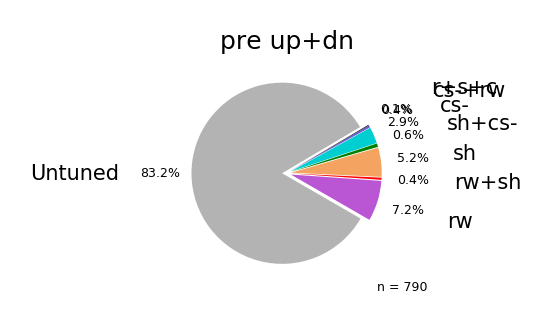

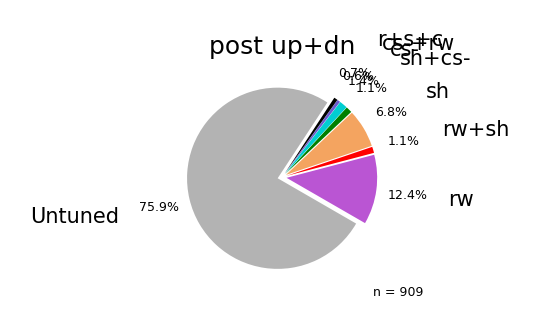

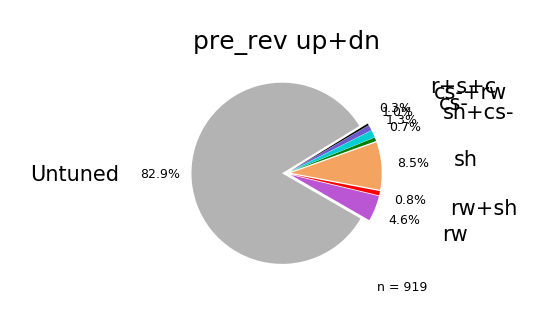

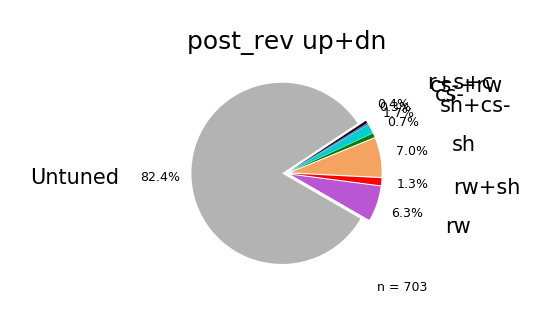

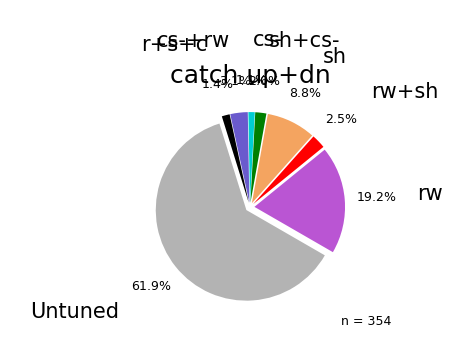

...

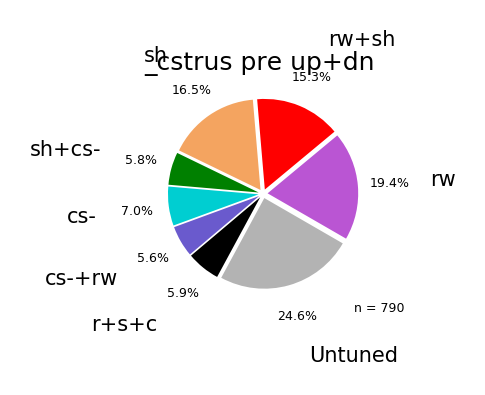

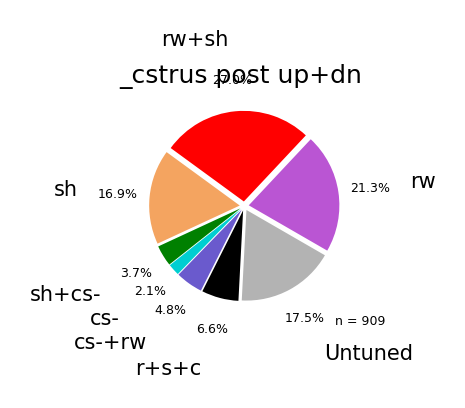

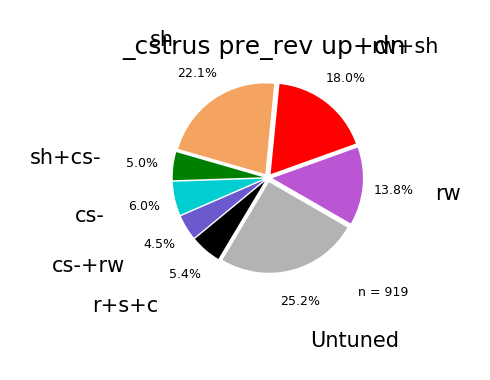

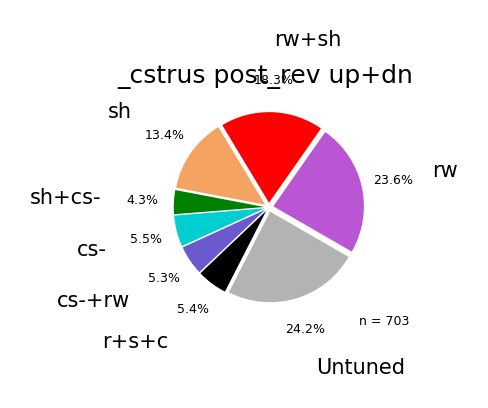

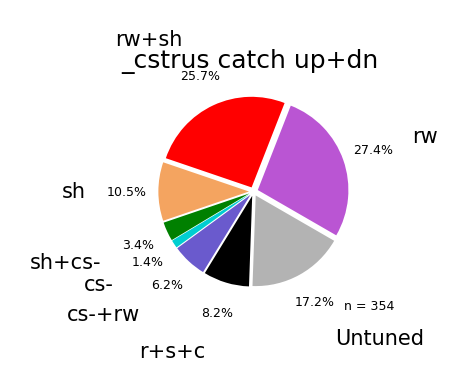

In [17]:
for f in feature:
    for s in session:
        pop1 = eval('cells_%srewardt%s_up' %(s,f)) + eval('cells_%srewardt%s_dn' %(s,f))
        pop2 = eval('cells_%ssht%s_up' %(s,f))+ eval('cells_%ssht%s_dn' %(s,f))
        pop3 = eval('cells_%sCSmt%s_up' %(s,f)) + eval('cells_%sCSmt%s_dn' %(s,f))
        unt = ~(pop1 + pop2 + pop3)
        N = len(pop1)
        
        fig, axs = plot_it_3odors(pop1, pop2, pop3,unt,
                    title='%s %s up+dn'%(f,s),labels=['rw','rw+sh','sh','sh+cs-','cs-','cs-+rw','r+s+c','Untuned'])

In [18]:
def plot_it_only_mod(pop1, pop2, pop3, labels=['rew', 'rew+sh', 'sh', 'sh+CS-','CS-','CS-+rew','rew+sh+CS-'],
                   title="3odor breakdown",colors=['mediumorchid','tab:red','sandybrown','tab:green','darkturquoise','slateblue','k']):
    fig, axs = pl.subplots(1, 1, figsize=(1, 1))

    ax = axs
    
    t = map(sum, [pop1*~pop2*~pop3, pop1*pop2*~pop3, pop2*~pop1*~pop3, pop2*pop3*~pop1, pop3*~pop1*~pop2, pop3*pop1*~pop2, pop1*pop2*pop3])
    total = np.sum(t)
    _, txts, _ = ax.pie(t, colors=colors, explode=[0.05]*len(t),
                        autopct=lambda x: "%.1f%%"%(x),pctdistance=1.35,
                        labels=labels,labeldistance=1.8,
                        textprops={'fontsize':4.7},startangle=-30)
    for tt in txts:
        tt.set_fontsize(5)
    ax.text(1, -2.1, 'n = %d'%total, fontsize=3)

    ax.set_aspect('equal')
    fig.suptitle(title,y=1.2,fontsize=7)
    
    return fig, axs,

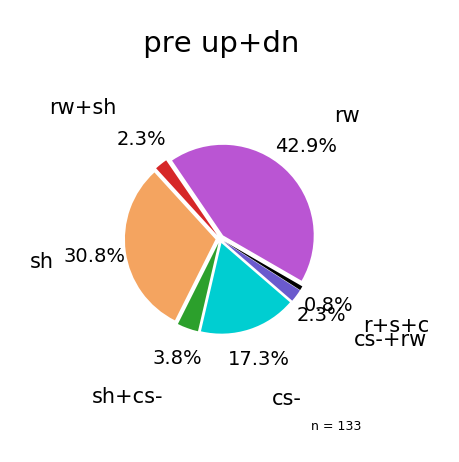

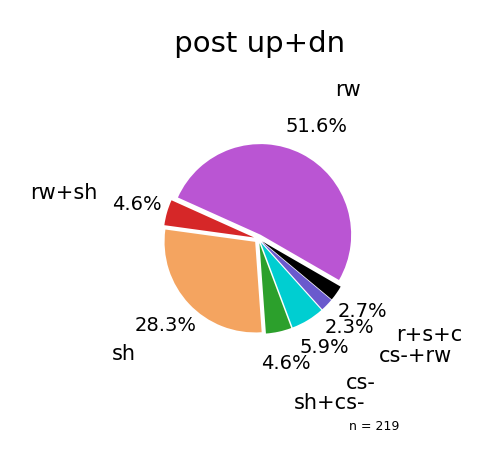

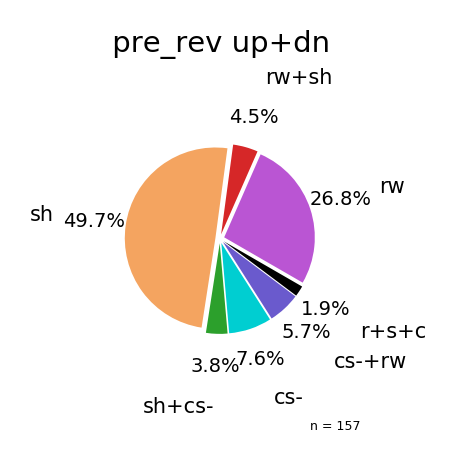

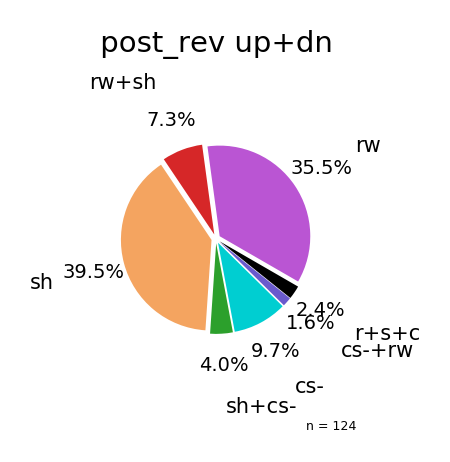

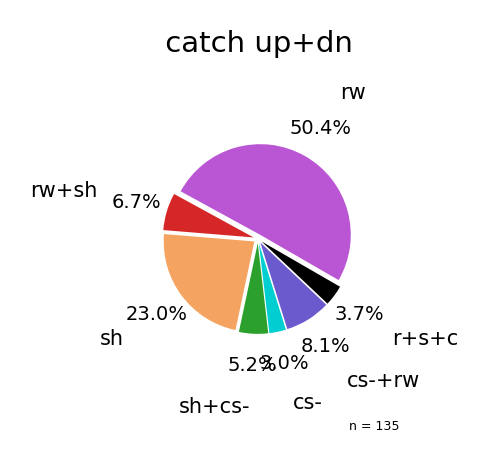

...

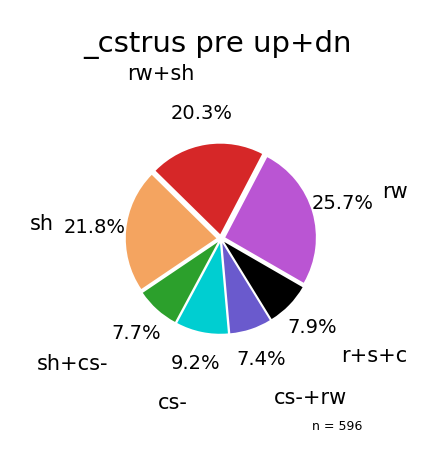

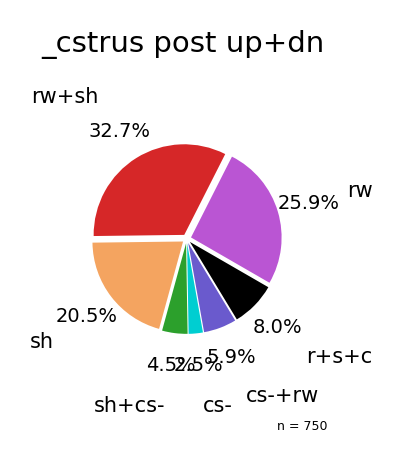

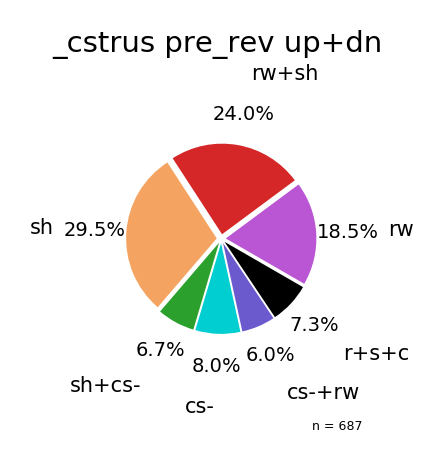

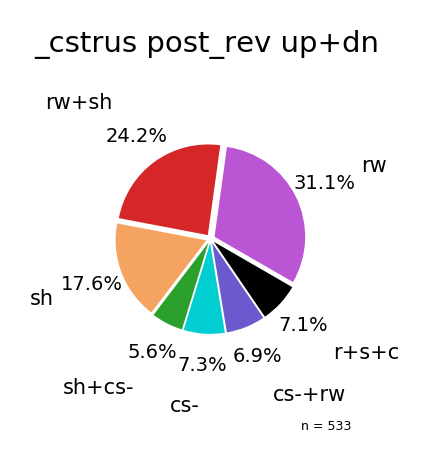

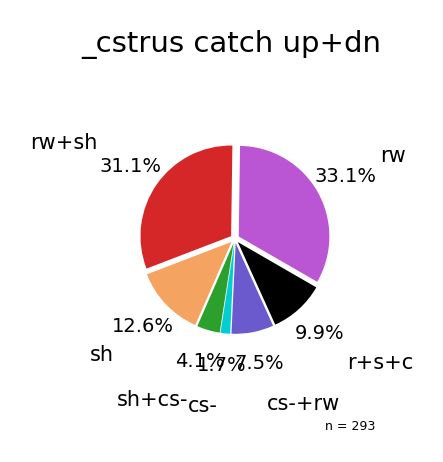

In [19]:
for f in feature:
    for s in session:
        pop1 = eval('cells_%srewardt%s_up' %(s,f)) + eval('cells_%srewardt%s_dn' %(s,f))
        pop2 = eval('cells_%ssht%s_up' %(s,f))+ eval('cells_%ssht%s_dn' %(s,f))
        pop3 = eval('cells_%sCSmt%s_up' %(s,f)) + eval('cells_%sCSmt%s_dn' %(s,f))
        unt = ~(pop1 + pop2 + pop3)
        
        fig, axs = plot_it_only_mod(pop1, pop2, pop3,
                    title='%s %s up+dn'%(f,s),labels=['rw','rw+sh','sh','sh+cs-','cs-','cs-+rw','r+s+c'])
        
#colors=['mediumorchid','r','sandybrown','g','darkturquoise','slateblue','k']

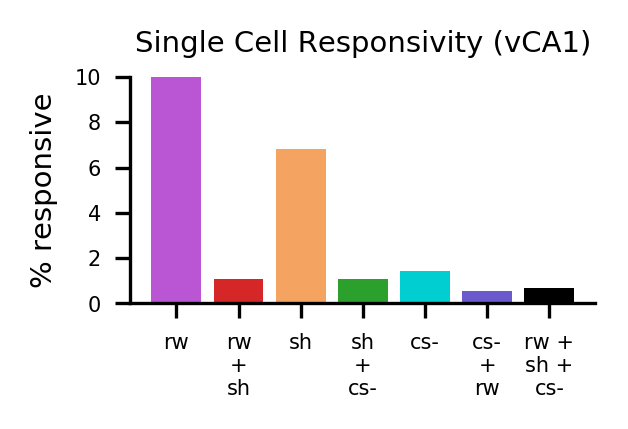

In [20]:
fig, ax = pl.subplots(1, 1, figsize=(2, 1))
x=range(7)
for f in ['']:
    for s in ['post']:
        pop1 = eval('cells_%srewardt%s_up' %(s,f)) + eval('cells_%srewardt%s_dn' %(s,f))
        pop2 = eval('cells_%ssht%s_up' %(s,f))+ eval('cells_%ssht%s_dn' %(s,f))
        pop3 = eval('cells_%sCSmt%s_up' %(s,f)) + eval('cells_%sCSmt%s_dn' %(s,f))

        t = map(sum, [pop1*~pop2*~pop3, pop1*pop2*~pop3, pop2*~pop1*~pop3, pop2*pop3*~pop1, pop3*~pop1*~pop2, pop3*pop1*~pop2, pop1*pop2*pop3])
        ax.bar(x,[t/(len(eval('cells_%srewardt%s_up' %(s,f)))*1.0)*100 for t in t],color=['mediumorchid','tab:red','sandybrown',
                                                                        'tab:green','darkturquoise','slateblue','k'])
        ax.set_xticks(x)
        ax.set_xticklabels(['rw','rw\n+\nsh','sh','sh\n+\ncs-','cs-','cs-\n+\nrw','rw +\nsh +\ncs-'])
        ax.set_title('Single Cell Responsivity (vCA1)')
        ax.set_ylabel('% responsive')
        ax.set_ylim(0,10)

In [47]:
def plot_pie(pop1, pop2, untuned, est, labels=['Pre', 'Post', 'Pre+Post', 'Untuned'], title="Sucrose",
            colors=['mediumorchid','darkturquoise','slateblue', (0.7, 0.7, 0.7)],
            hist_colors=[(1, 0.7, 0.7), 'darkslateblue']):
    fig, ax = pl.subplots(1, 1, figsize=(1, 1))
    
    t = map(sum, [pop1*~pop2, pop2*~pop1, pop1*pop2, untuned])
    total = np.sum(t)
    _, txts, _ = ax.pie(t, colors=colors, explode=[0.05]*len(t),
                        autopct=lambda x: "%.1f%%"%(x),pctdistance=1.35,
                        labels=labels,labeldistance=1.7,
                        textprops={'fontsize':4},startangle=-70)
    for tt in txts:
        tt.set_fontsize(5)
    ax.text(1, -1.7, 'n = %d'%total, fontsize=3)

    ax.set_aspect('equal')
    fig.suptitle(title,y=1.05)
    
    return fig, axs,

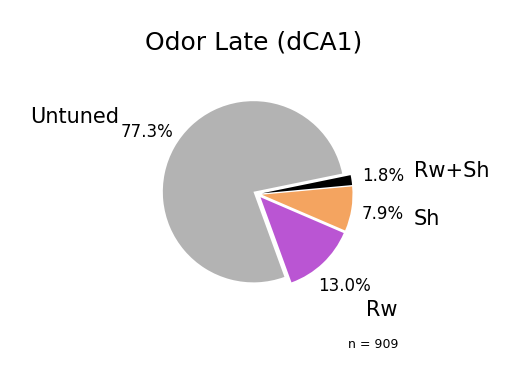

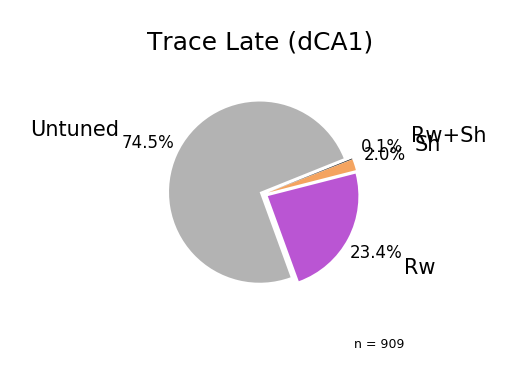

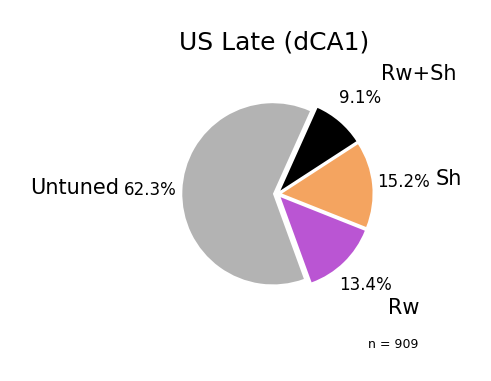

In [48]:
for f,lab in zip(['','_tr','_us'],['Odor','Trace','US']):
        comparison = '%s'%(f)
        pop1 = eval('cells_postrewardt%s_up' %(f)) + eval('cells_postrewardt%s_dn' %(f))
        pop2 = eval('cells_postsht%s_up' %(f))+ eval('cells_postsht%s_dn' %(f))
        unt = ~(pop1 + pop2)
        N = len(pop1)
        est = calc_shuffle_overlap(pop1, pop2, n_loops=n_loops, N=N)
        
        fig, axs = plot_pie(pop1, pop2, unt, est, colors=['mediumorchid','sandybrown','k',(0.7, 0.7, 0.7)], hist_colors=['silver','m'],
                               title='%s Late (dCA1)'%(lab),labels=['Rw','Sh', 'Rw+Sh', 'Untuned'])
        fig.savefig('../figures/%s_Late_pies_%s.pdf' %(NOTEBOOK_NAME,lab))
#        np.savetxt('../img/overlaps/overlaps_upANDdn_CSp_v_CSm_%s%s.pvs' %(s,f), [pv[-1]], header='One-sided t-test')

comparing across features within a trial type, up+down combined

for t in trial[:1]:      #CS+ trials only
    for f in feature[0:1]:
        for ff in feature:
            for s in session:
                if f != ff:
                    comparison = '%s%s_vs%s'%(s,f,ff)
                    pop1 = eval('cells_%s%s_up%s' %(s,t,f)) + eval('cells_%s%s_dn%s' %(s,t,f)) 
                    pop2 = eval('cells_%s%s_up%s' %(s,t,ff)) + eval('cells_%s%s_dn%s' %(s,t,ff))
                    unt = ~(pop1 + pop2)
                    N=len(pop1)
                    est = calc_shuffle_overlap(pop1, pop2, n_loops=n_loops)
                    
                    fig, axs = plot_it(pop1, pop2, unt, est, colors=['lightcoral','r','crimson',(0.8, 0.8, 0.8)],
                                       hist_colors=['silver','crimson'],
                               labels=['%s%s' %(t,f), '%s%s' %(t,ff), '%s%s,%s%s' %(t,f,t,ff), 'Untuned'], title='CS+ %s' %(s))
                    diff_from_chance_CSp_combined[comparison]=[np.mean(est),(pop1*pop2).mean(),((pop1*pop2).mean())-(np.mean(est)),
                          (((pop1*pop2).mean())-(np.mean(est)))/(np.mean(est)),
                          (((pop1*pop2).mean())-(np.mean(est)))/(np.std(est))]
                        
                    #fig.savefig('../img/overlaps/overlaps_upANDdn_win_%sp_%s_%svs%s.pdf' %(t,s,f,ff))
                    #np.savetxt('../img/overlaps/overlaps_upANDdn_win_%sp_%s_%svs%s.pvs' %(t,s,f,ff), [pv[-1]], header='One-sided t-test')   
                else:
                    print('skipping %s vs %s;' %(f,ff)),
                    

for t in trial[:1]:      #CS+ trials only
    for f in feature[1:2]:
        for ff in feature[2:]:
            for s in session:
                if f != ff:
                    comparison = '%s%s_vs%s'%(s,f,ff)
                    pop1 = eval('cells_%s%s_up%s' %(s,t,f)) + eval('cells_%s%s_dn%s' %(s,t,f)) 
                    pop2 = eval('cells_%s%s_up%s' %(s,t,ff)) + eval('cells_%s%s_dn%s' %(s,t,ff))
                    unt = ~(pop1 + pop2)
                    N=len(pop1)
                    est = calc_shuffle_overlap(pop1, pop2, n_loops=n_loops)
                    
                    fig, axs = plot_it(pop1, pop2, unt, est, colors=['lightcoral','r','crimson',(0.8, 0.8, 0.8)],
                                       hist_colors=['silver','crimson'],
                               labels=['%s%s' %(t,f), '%s%s' %(t,ff), '%s%s,%s%s' %(t,f,t,ff), 'Untuned'], title='CS+ %s' %(s))
                    diff_from_chance_CSp_combined[comparison]=[np.mean(est),(pop1*pop2).mean(),((pop1*pop2).mean())-(np.mean(est)),
                          (((pop1*pop2).mean())-(np.mean(est)))/(np.mean(est)),
                          (((pop1*pop2).mean())-(np.mean(est)))/(np.std(est))]
                        
                    #fig.savefig('../img/overlaps/overlaps_upANDdn_win_%sp_%s_%svs%s.pdf' %(t,s,f,ff))
                    #np.savetxt('../img/overlaps/overlaps_upANDdn_win_%sp_%s_%svs%s.pvs' %(t,s,f,ff), [pv[-1]], header='One-sided t-test')   
                else:
                    print('skipping %s vs %s;' %(f,ff)),
                    

In [ ]:
#use this to create a booklet
#!pdftk ../img/overlaps/overlaps_upANDdn_win_CSp*.pdf cat output ../img/overlaps/booklets/overlaps_upANDdn_win_CSp_booklet.pdf

for t in trial[1:]:      #CS- trials only
    for f in feature[0:1]:
        for ff in feature:
            for s in session:
                if f != ff:
                    comparison = '%s%s_vs%s'%(s,f,ff)
                    pop1 = eval('cells_%s%s_up%s' %(s,t,f)) + eval('cells_%s%s_dn%s' %(s,t,f)) 
                    pop2 = eval('cells_%s%s_up%s' %(s,t,ff)) + eval('cells_%s%s_dn%s' %(s,t,ff))
                    unt = ~(pop1 + pop2)
                    N=len(pop1)
                    est = calc_shuffle_overlap(pop1, pop2, n_loops=n_loops)
                    
                    fig, axs = plot_it(pop1, pop2, unt, est, colors=['lightskyblue','lightblue','b',(0.8, 0.8, 0.8)],
                                       hist_colors=['silver','b'],
                               labels=['%s%s' %(t,f), '%s%s' %(t,ff), '%s%s,%s%s' %(t,f,t,ff), 'Untuned'], title='CS- %s' %(s))
                    diff_from_chance_CSm_combined[comparison]=[np.mean(est),(pop1*pop2).mean(),((pop1*pop2).mean())-(np.mean(est)),
                          (((pop1*pop2).mean())-(np.mean(est)))/(np.mean(est)),
                          (((pop1*pop2).mean())-(np.mean(est)))/(np.std(est))]
                        
                    #fig.savefig('../img/overlaps/overlaps_upANDdn_win_%sp_%s_%svs%s.pdf' %(t,s,f,ff))
                    #np.savetxt('../img/overlaps/overlaps_upANDdn_win_%sp_%s_%svs%s.pvs' %(t,s,f,ff), [pv[-1]], header='One-sided t-test')   
                else:
                    print('skipping %s vs %s;' %(f,ff)),

for t in trial[1:]:      #CS- trials only
    for f in feature[1:2]:
        for ff in feature[1:]:
            for s in session:
                if f != ff:
                    comparison = '%s%s_vs%s'%(s,f,ff)
                    pop1 = eval('cells_%s%s_up%s' %(s,t,f)) + eval('cells_%s%s_dn%s' %(s,t,f)) 
                    pop2 = eval('cells_%s%s_up%s' %(s,t,ff)) + eval('cells_%s%s_dn%s' %(s,t,ff))
                    unt = ~(pop1 + pop2)
                    N=len(pop1)
                    est = calc_shuffle_overlap(pop1, pop2, n_loops=n_loops)
                    
                    fig, axs = plot_it(pop1, pop2, unt, est, colors=['lightskyblue','lightblue','b',(0.8, 0.8, 0.8)],
                                       hist_colors=['silver','b'],
                               labels=['%s%s' %(t,f), '%s%s' %(t,ff), '%s%s,%s%s' %(t,f,t,ff), 'Untuned'], title='CS- %s' %(s))
                    diff_from_chance_CSm_combined[comparison]=[np.mean(est),(pop1*pop2).mean(),((pop1*pop2).mean())-(np.mean(est)),
                          (((pop1*pop2).mean())-(np.mean(est)))/(np.mean(est)),
                          (((pop1*pop2).mean())-(np.mean(est)))/(np.std(est))]
                        
                    #fig.savefig('../img/overlaps/overlaps_upANDdn_win_%sp_%s_%svs%s.pdf' %(t,s,f,ff))
                    #np.savetxt('../img/overlaps/overlaps_upANDdn_win_%sp_%s_%svs%s.pvs' %(t,s,f,ff), [pv[-1]], header='One-sided t-test')   
                else:
                    print('skipping %s vs %s;' %(f,ff)),

#use this to create a booklet
#!pdftk ../img/overlaps/overlaps_upANDdn_win_CSm*.pdf cat output ../img/overlaps/booklets/overlaps_upANDdn_win_CSm_booklet.pdf

comparing across features within a trial type, up and down separated

for t in trial[:1]:      #CS+ trials only
    for f in feature[0:1]:
        for ff in feature:
            for s in session:
                for d in direction:
                    if f != ff:
                        comparison = '%s%s_vs%s_%s'%(s,f,ff,d)
                        pop1 = eval('cells_%s%s_%s%s' %(s,t,d,f))
                        pop2 = eval('cells_%s%s_%s%s' %(s,t,d,ff))
                        unt = ~(pop1 + pop2)
                        N=len(pop1)
                        est = calc_shuffle_overlap(pop1, pop2, n_loops=n_loops)
                        
                        if d == 'up':
                            colors=['lightcoral','r','crimson',(0.8, 0.8, 0.8)]
                            hist_colors=['silver','crimson']
                        else:
                            colors=['lightskyblue','lightblue','b',(0.8, 0.8, 0.8)]
                            hist_colors=['silver','b']
                            
                        fig, axs = plot_it(pop1, pop2, unt, est, colors=colors, hist_colors=hist_colors,
                                   labels=['%s%s' %(t,f), '%s%s' %(t,ff), '%s%s,%s%s' %(t,f,t,ff), 'Untuned'], title='CS+ %s %s' %(s,d))
                        diff_from_chance_CSp[comparison]=[np.mean(est),(pop1*pop2).mean(),((pop1*pop2).mean())-(np.mean(est)),
                              (((pop1*pop2).mean())-(np.mean(est)))/(np.mean(est)),
                              (((pop1*pop2).mean())-(np.mean(est)))/(np.std(est))]
                            
                        #fig.savefig('../img/overlaps/overlaps_upANDdn_win_%sp_%s_%svs%s.pdf' %(t,s,f,ff))
                        #np.savetxt('../img/overlaps/overlaps_upANDdn_win_%sp_%s_%svs%s.pvs' %(t,s,f,ff), [pv[-1]], header='One-sided t-test')   
                    else:
                        print('skipping %s vs %s;' %(f,ff)),                        

for t in trial[:1]:      #CS+ trials only
    for f in feature[1:2]:
        for ff in feature[1:3]:
            for s in session:
                for d in direction:
                    if f != ff:
                        comparison = '%s%s_vs%s_%s'%(s,f,ff,d)
                        pop1 = eval('cells_%s%s_%s%s' %(s,t,d,f))
                        pop2 = eval('cells_%s%s_%s%s' %(s,t,d,ff))
                        unt = ~(pop1 + pop2)
                        N=len(pop1)
                        est = calc_shuffle_overlap(pop1, pop2, n_loops=n_loops)
                        
                        if d == 'up':
                            colors=['lightcoral','r','crimson',(0.8, 0.8, 0.8)]
                            hist_colors=['silver','crimson']
                        else:
                            colors=['lightskyblue','lightblue','b',(0.8, 0.8, 0.8)]
                            hist_colors=['silver','b']
                            
                        fig, axs = plot_it(pop1, pop2, unt, est, colors=colors, hist_colors=hist_colors,
                                   labels=['%s%s' %(t,f), '%s%s' %(t,ff), '%s%s,%s%s' %(t,f,t,ff), 'Untuned'], title='CS+ %s %s' %(s,d))
                        diff_from_chance_CSp[comparison]=[np.mean(est),(pop1*pop2).mean(),((pop1*pop2).mean())-(np.mean(est)),
                              (((pop1*pop2).mean())-(np.mean(est)))/(np.mean(est)),
                              (((pop1*pop2).mean())-(np.mean(est)))/(np.std(est))]
                            
                        #fig.savefig('../img/overlaps/overlaps_upANDdn_win_%sp_%s_%svs%s.pdf' %(t,s,f,ff))
                        #np.savetxt('../img/overlaps/overlaps_upANDdn_win_%sp_%s_%svs%s.pvs' %(t,s,f,ff), [pv[-1]], header='One-sided t-test')   
                    else:
                        print('skipping %s vs %s;' %(f,ff)),                        

#use this to create a booklet
#!pdftk ../img/overlaps/overlaps_win_up_CSp*.pdf cat output ../img/overlaps/booklets/overlaps_win_up_CSp_booklet.pdf

for t in trial[1:]:      #CSm trials only
    for f in feature[0:1]:
        for ff in feature:
            for s in session:
                for d in direction:
                    if f != ff:
                        comparison = '%s%s_vs%s_%s'%(s,f,ff,d)
                        pop1 = eval('cells_%s%s_%s%s' %(s,t,d,f))
                        pop2 = eval('cells_%s%s_%s%s' %(s,t,d,ff))
                        unt = ~(pop1 + pop2)
                        N=len(pop1)
                        est = calc_shuffle_overlap(pop1, pop2, n_loops=n_loops)
                        
                        if d == 'up':
                            colors=['lightcoral','r','crimson',(0.8, 0.8, 0.8)]
                            hist_colors=['silver','crimson']
                        else:
                            colors=['lightskyblue','lightblue','b',(0.8, 0.8, 0.8)]
                            hist_colors=['silver','b']
                            
                        fig, axs = plot_it(pop1, pop2, unt, est, colors=colors, hist_colors=hist_colors,
                                   labels=['%s%s' %(t,f), '%s%s' %(t,ff), '%s%s,%s%s' %(t,f,t,ff), 'Untuned'], title='CS- %s %s' %(s,d))
                        diff_from_chance_CSm[comparison]=[np.mean(est),(pop1*pop2).mean(),((pop1*pop2).mean())-(np.mean(est)),
                              (((pop1*pop2).mean())-(np.mean(est)))/(np.mean(est)),
                              (((pop1*pop2).mean())-(np.mean(est)))/(np.std(est))]
                            
                        #fig.savefig('../img/overlaps/overlaps_upANDdn_win_%sp_%s_%svs%s.pdf' %(t,s,f,ff))
                        #np.savetxt('../img/overlaps/overlaps_upANDdn_win_%sp_%s_%svs%s.pvs' %(t,s,f,ff), [pv[-1]], header='One-sided t-test')   
                    else:
                        print('skipping %s vs %s;' %(f,ff)),                        

for t in trial[1:]:      #CSm trials only
    for f in feature[1:2]:
        for ff in feature[1:3]:
            for s in session:
                for d in direction:
                    if f != ff:
                        comparison = '%s%s_vs%s_%s'%(s,f,ff,d)
                        pop1 = eval('cells_%s%s_%s%s' %(s,t,d,f))
                        pop2 = eval('cells_%s%s_%s%s' %(s,t,d,ff))
                        unt = ~(pop1 + pop2)
                        N=len(pop1)
                        est = calc_shuffle_overlap(pop1, pop2, n_loops=n_loops)
                        
                        if d == 'up':
                            colors=['lightcoral','r','crimson',(0.8, 0.8, 0.8)]
                            hist_colors=['silver','crimson']
                        else:
                            colors=['lightskyblue','lightblue','b',(0.8, 0.8, 0.8)]
                            hist_colors=['silver','b']
                            
                        fig, axs = plot_it(pop1, pop2, unt, est, colors=colors, hist_colors=hist_colors,
                                   labels=['%s%s' %(t,f), '%s%s' %(t,ff), '%s%s,%s%s' %(t,f,t,ff), 'Untuned'], title='CS- %s %s' %(s,d))
                        diff_from_chance_CSm[comparison]=[np.mean(est),(pop1*pop2).mean(),((pop1*pop2).mean())-(np.mean(est)),
                              (((pop1*pop2).mean())-(np.mean(est)))/(np.mean(est)),
                              (((pop1*pop2).mean())-(np.mean(est)))/(np.std(est))]
                            
                        #fig.savefig('../img/overlaps/overlaps_upANDdn_win_%sp_%s_%svs%s.pdf' %(t,s,f,ff))
                        #np.savetxt('../img/overlaps/overlaps_upANDdn_win_%sp_%s_%svs%s.pvs' %(t,s,f,ff), [pv[-1]], header='One-sided t-test')   
                    else:
                        print('skipping %s vs %s;' %(f,ff)),                        

#use this to create a booklet
#!pdftk ../img/overlaps/overlaps_win_up_CSm*.pdf cat output ../img/overlaps/booklets/overlaps_win_up_CSm_booklet.pdf

In [ ]:
g='limegreen'
pr='r'
po='b'
e1='silver'
e2='grey'
rnw='y'

In [ ]:
fig, ax = pl.subplots(2, 1, figsize=(8, 4))
values = [diff_from_chance_rew_vs_sh_combined[t][2]*100 for t in sorted(diff_from_chance_rew_vs_sh_combined)]
valuesb = [diff_from_chance_rew_vs_sh_combined[t][4] for t in sorted(diff_from_chance_rew_vs_sh_combined)]

pt.plot_bars(values, ax=ax[0], colors = [g,g,g,e1,e1,e1,e2,e2,e2,po,po,po,pr,pr,pr,rnw,rnw,rnw])
pt.plot_bars(valuesb, ax=ax[1], colors = [g,g,g,e1,e1,e1,e2,e2,e2,po,po,po,pr,pr,pr,rnw,rnw,rnw])

ax[0].set_xticks(range(len(diff_from_chance_rew_vs_sh_combined)))
ax[0].set_xticklabels(sorted (diff_from_chance_rew_vs_sh_combined), rotation=70, fontsize=6)
ax[0].set_ylim(-1,10)
ax[0].hlines(0, -.5, len(diff_from_chance_rew_vs_sh_combined)-.5, 'k', 'dashed')
ax[0].set_ylabel('% Observed - % Chance')
ax[1].set_xticks(range(len(diff_from_chance_rew_vs_sh_combined)))
ax[1].set_xticklabels(sorted (diff_from_chance_rew_vs_sh_combined), rotation=70, fontsize=6)
ax[1].set_ylabel('Z-score')
ax[1].hlines(2, -.5, len(diff_from_chance_rew_vs_sh_combined)-.5, 'k', 'dashed')
ax[0].set_title('sucrose vs shock overlap of feature representations')
pl.tight_layout()
#fig.savefig('../img/overlaps/%s_rew_vs_sh_combined.jpg'%NOTEBOOK_NAME)

In [ ]:
diff_from_chance_rew_vs_sh_combined

In [ ]:
fig, ax = pl.subplots(2, 1, figsize=(8, 4))
values = [diff_from_chance_CSp_vs_CSm[t][2]*100 for t in sorted(diff_from_chance_CSp_vs_CSm)]
valuesb = [diff_from_chance_CSp_vs_CSm[t][4] for t in sorted(diff_from_chance_CSp_vs_CSm)]
pt.plot_bars(values, ax=ax[0], colors = [g,g,g,g,g,g,e1,e1,e1,e1,e1,e1,e2,e2,e2,e2,e2,e2,po,po,po,po,po,po,
                                      pr,pr,pr,pr,pr,pr,rnw,rnw,rnw,rnw,rnw,rnw])
pt.plot_bars(valuesb, ax=ax[1], colors = [g,g,g,g,g,g,e1,e1,e1,e1,e1,e1,e2,e2,e2,e2,e2,e2,po,po,po,po,po,po,
                                      pr,pr,pr,pr,pr,pr,rnw,rnw,rnw,rnw,rnw,rnw])
ax[0].set_xticks(range(len(diff_from_chance_CSp_vs_CSm)))
ax[0].set_xticklabels(sorted (diff_from_chance_CSp_vs_CSm), rotation=70, fontsize=6)
ax[0].set_ylim(-1,10)
ax[0].hlines(0, -.5, len(diff_from_chance_CSp_vs_CSm)-.5, 'k', 'dashed')
ax[0].set_ylabel('% Observed - % Chance')
ax[1].set_xticks(range(len(diff_from_chance_CSp_vs_CSm)))
ax[1].set_xticklabels(sorted (diff_from_chance_CSp_vs_CSm), rotation=70, fontsize=6)
ax[1].set_ylabel('Z-score')
ax[1].hlines(2, -.5, len(diff_from_chance_CSp_vs_CSm)-.5, 'k', 'dashed')
ax[0].set_title('CS+ vs CS- overlap of feature representations (dn or up)')
pl.tight_layout()
fig.savefig('../img/overlaps/%s_CSp_vs_CSm.jpg'%NOTEBOOK_NAME)

In [ ]:
fig, ax = pl.subplots(2, 1, figsize=(8, 4))
values = [diff_from_chance_CSp[t][2]*100 for t in sorted(diff_from_chance_CSp)]
valuesb = [diff_from_chance_CSp[t][4] for t in sorted(diff_from_chance_CSp)]
pt.plot_bars(values, ax=ax[0], colors = [g,g,g,g,g,g,e1,e1,e1,e1,e1,e1,e2,e2,e2,e2,e2,e2,po,po,po,po,po,po,
                                      pr,pr,pr,pr,pr,pr,rnw,rnw,rnw,rnw,rnw,rnw])
pt.plot_bars(valuesb, ax=ax[1], colors = [g,g,g,g,g,g,e1,e1,e1,e1,e1,e1,e2,e2,e2,e2,e2,e2,po,po,po,po,po,po,
                                      pr,pr,pr,pr,pr,pr,rnw,rnw,rnw,rnw,rnw,rnw])
ax[0].set_xticks(range(len(diff_from_chance_CSp)))
ax[0].set_xticklabels(sorted (diff_from_chance_CSp), rotation=70, fontsize=6)
ax[0].set_ylim(-1,10)
ax[0].hlines(0, -.5, len(diff_from_chance_CSp)-.5, 'k', 'dashed')
ax[0].set_ylabel('% Observed - % Chance')
ax[1].set_xticks(range(len(diff_from_chance_CSp)))
ax[1].set_xticklabels(sorted (diff_from_chance_CSp), rotation=70, fontsize=6)
ax[1].set_ylabel('Z-score')
ax[1].hlines(2, -.5, len(diff_from_chance_CSp)-.5, 'k', 'dashed')
ax[0].set_title('CS+ overlap of feature representations (dn or up)')
pl.tight_layout()
fig.savefig('../img/overlaps/%s_CSp.jpg'%NOTEBOOK_NAME)

In [ ]:
fig, ax = pl.subplots(2, 1, figsize=(8, 4))
values = [diff_from_chance_CSm[t][2]*100 for t in sorted(diff_from_chance_CSm)]
valuesb = [diff_from_chance_CSm[t][4] for t in sorted(diff_from_chance_CSm)]
pt.plot_bars(values, ax=ax[0], colors = [g,g,g,g,g,g,e1,e1,e1,e1,e1,e1,e2,e2,e2,e2,e2,e2,po,po,po,po,po,po,
                                      pr,pr,pr,pr,pr,pr,rnw,rnw,rnw,rnw,rnw,rnw])
pt.plot_bars(valuesb, ax=ax[1], colors = [g,g,g,g,g,g,e1,e1,e1,e1,e1,e1,e2,e2,e2,e2,e2,e2,po,po,po,po,po,po,
                                      pr,pr,pr,pr,pr,pr,rnw,rnw,rnw,rnw,rnw,rnw])
ax[0].set_xticks(range(len(diff_from_chance_CSm)))
ax[0].set_xticklabels(sorted (diff_from_chance_CSm), rotation=70, fontsize=6)
ax[0].set_ylim(-1,10)
ax[0].hlines(0, -.5, len(diff_from_chance_CSm)-.5, 'k', 'dashed')
ax[0].set_ylabel('% Observed - % Chance')
ax[1].set_xticks(range(len(diff_from_chance_CSm)))
ax[1].set_xticklabels(sorted (diff_from_chance_CSm), rotation=70, fontsize=6)
ax[1].set_ylabel('Z-score')
ax[1].hlines(2, -.5, len(diff_from_chance_CSm)-.5, 'k', 'dashed')
ax[0].set_title('CS- overlap of feature representations (dn or up)')
pl.tight_layout()
fig.savefig('../img/overlaps/%s_CSm.jpg'%NOTEBOOK_NAME)

In [ ]:
fig, ax = pl.subplots(2, 1, figsize=(8, 4))
values = [diff_from_chance_CSp_combined[t][2]*100 for t in sorted(diff_from_chance_CSp_combined)]
valuesb = [diff_from_chance_CSp_combined[t][4] for t in sorted(diff_from_chance_CSp_combined)]
pt.plot_bars(values, ax=ax[0], colors = [g,g,g,e1,e1,e1,e2,e2,e2,po,po,po,pr,pr,pr,rnw,rnw,rnw])
pt.plot_bars(valuesb, ax=ax[1], colors = [g,g,g,e1,e1,e1,e2,e2,e2,po,po,po,pr,pr,pr,rnw,rnw,rnw])
ax[0].set_xticks(range(len(diff_from_chance_CSp_combined)))
ax[0].set_xticklabels(sorted (diff_from_chance_CSp_combined), rotation=70, fontsize=6)
pt.nicer_plot(ax[0])
ax[0].set_ylim(-1,10)
ax[0].hlines(0, -.5, len(diff_from_chance_CSp_combined)-.5, 'k', 'dashed')
ax[0].set_ylabel('% Observed - % Chance')
ax[1].set_xticks(range(len(diff_from_chance_CSp_combined)))
ax[1].set_xticklabels(sorted (diff_from_chance_CSp_combined), rotation=70, fontsize=6)
ax[1].set_ylabel('Z-score')
ax[1].hlines(2, -.5, len(diff_from_chance_CSp_combined)-.5, 'k', 'dashed')
ax[0].set_title('CS+ overlap of feature representations')
pl.tight_layout()
fig.savefig('../img/overlaps/%s_CSp_combined.jpg'%NOTEBOOK_NAME)

In [ ]:
fig, ax = pl.subplots(2, 1, figsize=(8, 4))
values = [diff_from_chance_CSm_combined[t][2]*100 for t in sorted(diff_from_chance_CSp_combined)]
valuesb = [diff_from_chance_CSm_combined[t][4] for t in sorted(diff_from_chance_CSp_combined)]
pt.plot_bars(values, ax=ax[0], colors = [g,g,g,e1,e1,e1,e2,e2,e2,po,po,po,pr,pr,pr,rnw,rnw,rnw])
pt.plot_bars(valuesb, ax=ax[1], colors = [g,g,g,e1,e1,e1,e2,e2,e2,po,po,po,pr,pr,pr,rnw,rnw,rnw])
ax[0].set_xticks(range(len(diff_from_chance_CSm_combined)))
ax[0].set_xticklabels(sorted (diff_from_chance_CSm_combined), rotation=70, fontsize=6)
pt.nicer_plot(ax[0])
ax[0].set_ylim(-1,10)
ax[0].hlines(0, -.5, len(diff_from_chance_CSm_combined)-.5, 'k', 'dashed')
ax[0].set_ylabel('% Observed - % Chance')
ax[1].set_xticks(range(len(diff_from_chance_CSm_combined)))
ax[1].set_xticklabels(sorted (diff_from_chance_CSm_combined), rotation=70, fontsize=6)
ax[1].set_ylabel('Z-score')
ax[1].hlines(2, -.5, len(diff_from_chance_CSm_combined)-.5, 'k', 'dashed')
ax[0].set_title('CS- overlap of feature representations')
pl.tight_layout()
fig.savefig('../img/overlaps/%s_CSm_combined.jpg'%NOTEBOOK_NAME)

# up vs down modulated cells for individual trial features

In [ ]:
def plot_it_updn(pop1, pop2, untuned, labels=['up', 'down', 'Untuned'], title="Sucrose",
            colors=[(1, 0., 0.2), (1, 0.5, 0.2),(0.8, 0.8, 0.8)]):
    fig, ax = pl.subplots(1, 1, figsize=(3, 1))


    t = map(sum, [pop1*~pop2+pop1*pop2, pop2*~pop1+pop1*pop2, untuned])
    total = np.sum(t)
    _, txts, _ = ax.pie(t, colors=colors, explode=[0.05]*len(t),
                        autopct=lambda x: "%.1f%%"%(x),
                        labels=labels,
                        textprops={'fontsize':3})
    for tt in txts:
        tt.set_fontsize(5)
    ax.text(1, -1.3, 'n = %d'%total, fontsize=3)

    ax.set_aspect('equal')
    fig.suptitle(title)
    
    return fig, axs

In [ ]:
#for f in feature:
#    for s in session:
#        pop1 = eval('cells_%sCS_up%s' %(s,f))
#        pop2 = eval('cells_%sCS_dn%s' %(s,f))
#        unt = ~(pop1 + pop2)
#        #est = calc_shuffle_overlap(pop1, pop2, n_loops=n_loops)
#        
#        fig, axs = plot_it_updn(pop1, pop2, unt, labels=['%s_up' %(f[1:]), '%s_dn' %(f[1:]), 'Untuned'], title='CS+ %s' %(s),
#                           colors=[(1,0,0.2), (0.2, 0.5, 1), (0.8, 0.8, 0.8)])
##        fig.savefig('../img/overlaps/CSp-up_v_down_%s%s.pdf' %(s,f))
##        np.savetxt('../img/overlaps/CSp-up_v_down_%s%s.pvs' %(s,f), [pv[-1]], header='One-sided t-test')

In [ ]:
#use this to create a booklet
#!pdftk ../img/overlaps/CSp-up_v_down*.pdf cat output ../img/overlaps/booklets/CSp-up_v_down_booklet.pdf

In [ ]:
#for f in feature:  #excluding licks feature
#    for s in session:
#        pop1 = eval('cells_%sCSm_up%s' %(s,f))
#        pop2 = eval('cells_%sCSm_dn%s' %(s,f))
#        unt = ~(pop1 + pop2)
#        #est = calc_shuffle_overlap(pop1, pop2, n_loops=n_loops)
#        
#        fig, axs = plot_it_updn(pop1, pop2, unt, labels=['%s_up' %(f[1:]), '%s_dn' %(f[1:]), 'Untuned'], title='CS- %s' %(s),
#                           colors=[(1,0,0.2), (0.2, 0.5, 1), (0.8, 0.8, 0.8)])
##        fig.savefig('../img/overlaps/CSm-up_v_down_%s%s.pdf' %(s,f))
##        np.savetxt('../img/overlaps/CSm-up_v_down_%s%s.pvs' %(s,f), [pv[-1]], header='One-sided t-test')

In [ ]:
#use this to create a booklet
#!pdftk ../img/overlaps/CSm-up_v_down_*.pdf cat output ../img/overlaps/booklets/CSm-up_v_down_booklet.pdf

In [ ]:
#for f in feature:
#    for s in session:
#        pop1 = eval('cells_%sCS_up%s' %(s,f)) + eval('cells_%sCS_dn%s' %(s,f))
#        pop2 = eval('cells_%sCSm_up%s' %(s,f))+ eval('cells_%sCSm_dn%s' %(s,f))
#        unt = ~(pop1 + pop2)
#        #est = calc_shuffle_overlap(pop1, pop2, n_loops=n_loops)
#        
#        fig, axs = plot_it_updn(pop1, pop2, unt, labels=['%s_CS+' %(f[1:]), '%s_CS-' %(f[1:]), 'Untuned'], title='%s' %(s),
#                           colors=['m', 'c', (0.8, 0.8, 0.8)])
##        fig.savefig('../img/overlaps/CSp_v_CSm_combined_%s%s.pdf' %(s,f))
##        np.savetxt('../img/overlaps/CSp_v_CSm_combined_%s%s.pvs' %(s,f), [pv[-1]], header='One-sided t-test')

In [ ]:
#use this to create a booklet
#!pdftk ../img/overlaps/CSp_v_CSm_combined_*.pdf cat output ../img/overlaps/booklets/CSm-up_v_down_booklet.pdf

In [ ]:
fig, axs = pl.subplots(1, 5, figsize=(5, 1))

f=feature[0]
print f
for s, ax in zip(session, axs):
        pop1 = eval('cells_%srewardt%s_up' %(s,f)) + eval('cells_%srewardt%s_dn' %(s,f))
        pop2 = eval('cells_%sCSmt%s_up' %(s,f))+ eval('cells_%sCSmt%s_dn' %(s,f))
        pop3 = eval('cells_%ssht%s_up' %(s,f)) + eval('cells_%ssht%s_dn' %(s,f))
        unt = ~(pop1 + pop2 + pop3)
        t = map(sum, [pop1*~pop2+pop1*pop2, pop2*~pop1+pop1*pop2, pop3, unt])
        
        p = ax.pie(t,labels=['CS+', 'CS-', 'sh', 'Unt.'], colors=['m', 'c', 'sandybrown', '0.7'], autopct=lambda x: "%.1f%%"%(x))
        ax.set_title(s)
        for pp in p[1]:
            pp.set_fontsize(5)
        for pp in p[2]:
            pp.set_fontsize(3)
        
    
        ax.set_aspect('equal')


#fig.savefig('../img/overlaps/CSp_v_CSm_combined_pies.pdf', bbox='tight')

In [ ]:
fig, axs = pl.subplots(1, 5, figsize=(5, 1))

f=feature[0]
print f
for s, ax in zip(session, axs):
        pop1 = eval('cells_%srewardt%s_up' %(s,f)) + eval('cells_%srewardt%s_dn' %(s,f))
        pop2 = eval('cells_%sCSmt%s_up' %(s,f))+ eval('cells_%sCSmt%s_dn' %(s,f))
        pop3 = eval('cells_%ssht%s_up' %(s,f)) + eval('cells_%ssht%s_dn' %(s,f))
        unt = ~(pop1 + pop2 + pop3)
        t = map(sum, [pop1*~pop2+pop1*~pop3+pop1*pop2+pop1*pop3+pop1*pop2*pop3, pop2, pop3, unt])
        
        p = ax.pie(t,labels=['CS+', 'CS-', 'sh', 'Unt.'], colors=['m', 'c', 'sandybrown', '0.7'], autopct=lambda x: "%.1f%%"%(x))
        ax.set_title(s)
        for pp in p[1]:
            pp.set_fontsize(5)
        for pp in p[2]:
            pp.set_fontsize(3)
        
    
        ax.set_aspect('equal')
        ax.text(0, 1, "n = %d"%(len(eval("cells_%srewardt%s_up"%(s,f)))), transform=ax.transAxes, fontsize=3)


#fig.savefig('../img/overlaps/CSp_v_CSm_combined_pies.pdf', bbox='tight')

In [ ]:
fig, axs = pl.subplots(1, 6, figsize=(6, 1))

f=feature[0]
print f
for s, ax in zip(session, axs):
        pop1 = eval('cells_%sCS_up%s' %(s,f))
        pop2 = eval('cells_%sCS_dn%s' %(s,f))
        unt = ~(pop1 + pop2)
        t = map(sum, [pop1*~pop2+pop1*pop2, pop2*~pop1+pop1*pop2, unt])
        
        p = ax.pie(t,labels=['CS+ up', 'CS+ dn', 'Unt.'], colors=[(1,0,0.2), (0.2, 0.5, 1), '0.7'], autopct=lambda x: "%.1f%%"%(x))
        ax.set_title(s)
        for pp in p[1]:
            pp.set_fontsize(5)
        for pp in p[2]:
            pp.set_fontsize(3)
        
    #    ax.text(0, 1, "n = %d"%(len(eval("pvs_%s"%sess)['csp'])), transform=ax.transAxes, fontsize=3)
    
        ax.set_aspect('equal')


#fig.savefig('../img/overlaps/CSp_upVsdn_combined_pies.jpg', bbox='tight')

In [ ]:
fig, axs = pl.subplots(1, 6, figsize=(6, 1))

f=feature[1]
print f
for s, ax in zip(session, axs):
        pop1 = eval('cells_%sCS_up%s' %(s,f)) + eval('cells_%sCS_dn%s' %(s,f))
        pop2 = eval('cells_%sCSm_up%s' %(s,f))+ eval('cells_%sCSm_dn%s' %(s,f))
        unt = ~(pop1 + pop2)
        t = map(sum, [pop1*~pop2+pop1*pop2, pop2*~pop1+pop1*pop2, unt])
        
        p = ax.pie(t,labels=['Tr+', 'Tr-', 'Unt.'], colors=['m', 'c', '0.7'], autopct=lambda x: "%.1f%%"%(x))
        ax.set_title(s)
        for pp in p[1]:
            pp.set_fontsize(5)
        for pp in p[2]:
            pp.set_fontsize(3)
        
    #    ax.text(0, 1, "n = %d"%(len(eval("pvs_%s"%sess)['csp'])), transform=ax.transAxes, fontsize=3)
    
        ax.set_aspect('equal')


#fig.savefig('../img/overlaps/TRp_v_TRm_combined_pies.pdf', bbox='tight')

In [ ]:
fig, axs = pl.subplots(1, 6, figsize=(6, 1))

f=feature[1]
print f
for s, ax in zip(session, axs):
        pop1 = eval('cells_%sCS_up%s' %(s,f))
        pop2 = eval('cells_%sCS_dn%s' %(s,f))
        unt = ~(pop1 + pop2)
        t = map(sum, [pop1*~pop2+pop1*pop2, pop2*~pop1+pop1*pop2, unt])
        
        p = ax.pie(t,labels=['Tr+ up', 'Tr+ dn', 'Unt.'], colors=[(1,0,0.2), (0.2, 0.5, 1), '0.7'], autopct=lambda x: "%.1f%%"%(x))
        ax.set_title(s)
        for pp in p[1]:
            pp.set_fontsize(5)
        for pp in p[2]:
            pp.set_fontsize(3)
        
    #    ax.text(0, 1, "n = %d"%(len(eval("pvs_%s"%sess)['csp'])), transform=ax.transAxes, fontsize=3)
    
        ax.set_aspect('equal')


#fig.savefig('../img/overlaps/TRp_upVsdn_combined_pies.jpg', bbox='tight')

In [ ]:
fig, axs = pl.subplots(1, 6, figsize=(6, 1))

f=feature[2]
print f
for s, ax in zip(session, axs):
        pop1 = eval('cells_%sCS_up%s' %(s,f)) + eval('cells_%sCS_dn%s' %(s,f))
        pop2 = eval('cells_%sCSm_up%s' %(s,f))+ eval('cells_%sCSm_dn%s' %(s,f))
        unt = ~(pop1 + pop2)
        t = map(sum, [pop1*~pop2+pop1*pop2, pop2*~pop1+pop1*pop2, unt])
        
        p = ax.pie(t,labels=['US+', 'US-', 'Unt.'], colors=['m', 'c', '0.7'], autopct=lambda x: "%.1f%%"%(x))
        ax.set_title(s)
        for pp in p[1]:
            pp.set_fontsize(5)
        for pp in p[2]:
            pp.set_fontsize(3)
        
    #    ax.text(0, 1, "n = %d"%(len(eval("pvs_%s"%sess)['csp'])), transform=ax.transAxes, fontsize=3)
    
        ax.set_aspect('equal')


#fig.savefig('../img/overlaps/USp_v_USm_combined_pies.pdf', bbox='tight')

In [ ]:
save_workspace(db)